## 0. Preliminaries

* mount Google Drive;
* install libraries;
* import the data.

In [1]:
# mount Google drive:
from google.colab import drive
drive.mount('/content/drive')

# enable Colab data table interactive display:
from google.colab import data_table
data_table.enable_dataframe_formatter()

Mounted at /content/drive


In [2]:
# supress warnings:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import time
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.gofplots import ProbPlot
from IPython.display import Image, display
from collections import Counter
from sklearn.compose import make_column_selector as selector
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.eval_measures import rmse
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.cross_decomposition import PLSRegression
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

In [4]:
data=pd.read_excel("/content/drive/My Drive/Colab Notebooks/Native Wood Data.xlsx")
display(data.head())
data.shape

,Common species names,Wood type,Moisture content,Specific gravity,Modulus of rupture (MPa),Modulus of elasticity (GPa),Work to maximum load (MJ/m3),Impact bending (mm),Compression parallel to grain (MPa),Compression perpendicular to grain (MPa),Shear parallel to grain (MPa),Tension perpendicular to grain (MPa),Side hardness (kN)
0,"Alder, red",Hard,Green,0.37,45,8.1,0.055,560,20.4,1.7,5.3,2.7,2
1,"Alder, red",Hard,Dry,0.41,68,9.5,0.058,510,40.1,3,7.4,2.9,2.6
2,"Ash, Black",Hard,Green,0.45,41,7.2,0.083,840,15.9,2.4,5.9,3.4,2.3
3,"Ash, Black",Hard,Dry,0.49,87,11,0.103,890,41.2,5.2,10.8,4.8,3.8
4,"Ash, Blue",Hard,Green,0.53,66,8.5,0.101,—,24.8,5.6,10.6,—,—


(226, 13)

Display the number of distinct wood species:

In [5]:
print(len(set(data['Common species names'])))

113


## 1. Quick Glance at the Data

### Split the data into train and test sets

**Strategy:**

We are paying attention to the data structure:
We will choose (randomly) 75% of the **species** (including the information on two moisture content states) with complete information for training the models, we will reserve 25% for testing.


We use the property of `np.nan` that $\forall a \in \mathbb{R}, \: \text{NaN}+a=\text{NaN}$.

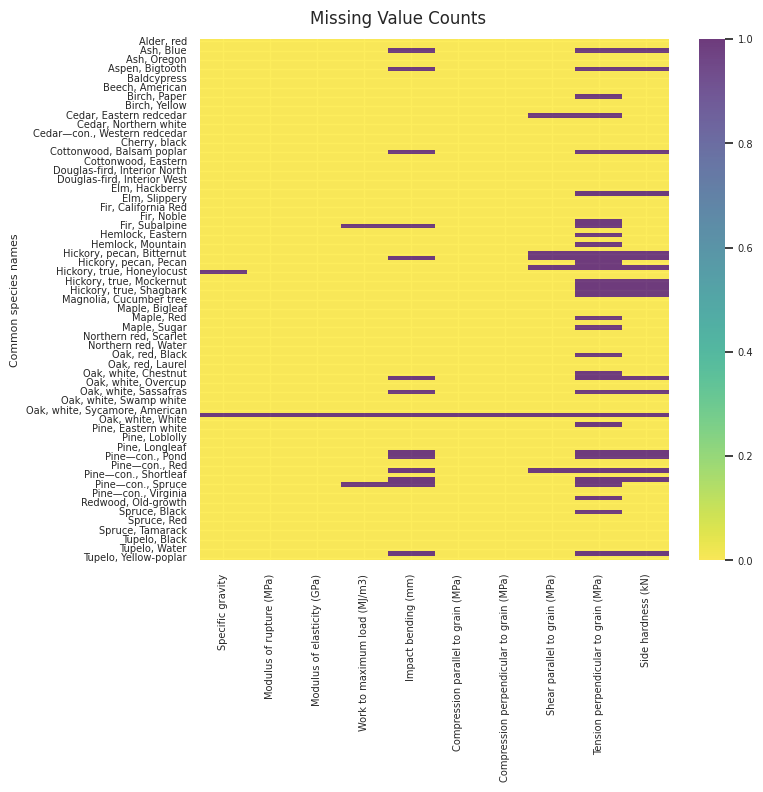

In [6]:
# replace dashes with blanks:
data = data.replace('—', np.nan)
# group by common wood species names, aggregation function: sum
d_ = data.groupby(['Common species names'])[['Specific gravity', 'Modulus of rupture (MPa)',
                                             'Modulus of elasticity (GPa)', 'Work to maximum load (MJ/m3)',
                                             'Impact bending (mm)', 'Compression parallel to grain (MPa)',
                                             'Compression perpendicular to grain (MPa)',
                                             'Shear parallel to grain (MPa)', 'Tension perpendicular to grain (MPa)',
                                             'Side hardness (kN)']].apply(lambda x : x.sum(skipna=False) )

# plot MVs:
plt.figure(figsize=(8, 8))
sns.set(font_scale = 0.65)
sns.heatmap(d_.isnull(), cmap='viridis_r', alpha=0.75)
plt.suptitle('Missing Value Counts', fontsize=12)
plt.tight_layout()

Remove the observations containing MVs and split the complete data into the training and test sets.

In [7]:
# drop rows containing MVs (if any) to obtain complete cases on the species level:
dt = d_.dropna()
print(f"Number of obs removed: {(d_.shape[0] - dt.shape[0])}")
print(f"Share of obs removed: {1-dt.shape[0]/d_.shape[0]:.2%}")

# set(dt.index) represents the complete cases on species level
# select at random approximately 15% of the species for the test set, the rest will constitute the training set
np.random.seed(42)
test_ratio = 0.25
test = np.random.choice(np.array(dt.index), int(np.ceil(test_ratio*len(set(dt.index)))))

# these are already unique we can now separate the original df into complete vs. incomplete cases
complete = data.loc[data['Common species names'].isin(set(dt.index))]
incomplete = data.loc[~data['Common species names'].isin(set(dt.index))]

# subdivide the complete cases into training and test sets:
complete_test = complete.loc[complete['Common species names'].isin(set(test))]
complete_train = complete.loc[~complete['Common species names'].isin(set(test))]

# drop the 'species' variables (not needed for further analysis):
complete_train.drop(['Common species names'], axis=1, inplace=True)
complete_test.drop(['Common species names'], axis=1, inplace=True)
incomplete.drop(['Common species names'], axis=1, inplace=True)


print("Train set size: ", complete_train.shape[0])
print("Test set size: ", complete_test.shape[0])
print("Incomplete set size: ", incomplete.shape[0] )

Number of obs removed: 35
Share of obs removed: 30.97%
Train set size:  122
Test set size:  34
Incomplete set size:  70


In [8]:
# run the dimensions check (the number of obs in all three sets should sum up to 226):
assert (complete_train.shape[0] + complete_test.shape[0] + incomplete.shape[0] == 226)

We work only with the complete cases and start with checking the composition of the training and test sets by the control variables `Wood type` and `Moisture content`.

In [9]:
Size_Legend = 11
Size_Title = 15
Size_Axis_Value = 17

In [10]:
# add annotations (teken from https://stackoverflow.com/questions/28931224/how-to-add-value-labels-on-a-bar-chart)
def add_value_labels(ax, spacing=5):
    """Add labels to the end of each bar in a bar chart.

    Arguments:
        ax (matplotlib.axes.Axes): The matplotlib object containing the axes
            of the plot to annotate.
        spacing (int): The distance between the labels and the bars.
    """

    # for each bar: place a label
    for rect in ax.patches:
        # get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2


        space = spacing # number of points between bar and label
        va = 'bottom' # vertical alignment for positive values

        # if value of bar is negative: Place label below bar
        if y_value < 0:
            space *= -1 # invert space to place label below
            va = 'top' # vertically align label at top


        label = "{:.0f}%".format(y_value) # use Y value as label and format number with one decimal place

        # create annotation
        ax.annotate(
            label,                      # use `label` as label
            (x_value, y_value),         # place label at end of the bar
            xytext=(0, space),          # vertically shift label by `space`
            textcoords="offset points", # interpret `xytext` as offset in points
            ha='center',                # horizontally center label
            va=va, size=9)                      # vertically align label differently for positive and negative values

<Figure size 2560x1920 with 0 Axes>

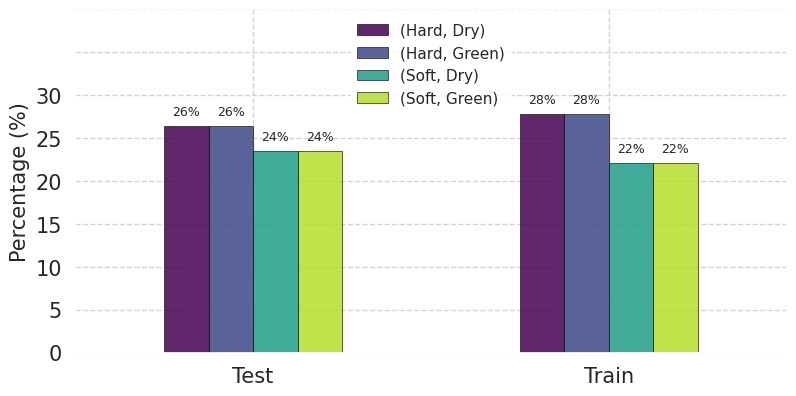

In [11]:
# check the composition of the training and test sets
t1 = complete_train[['Wood type', 'Moisture content']]
t1['Set'] = 'Train'
t2 = complete_test[['Wood type', 'Moisture content']]
t2['Set'] = 'Test'

t = pd.concat([t1, t2], axis=0)

# crosstab with three variables
crosstab = pd.crosstab(t['Set'], [t['Wood type'], t['Moisture content']]).apply(lambda r: r/r.sum()*100, axis=1)

plt.figure(dpi =400)
colors = ['#440154', '#3e4989', '#1f9e89', '#b5de2b']
ct = crosstab.plot(kind='bar', rot=0, color=colors, alpha=0.85, figsize=(8, 4), edgecolor = 'black', linewidth=0.5)
# ct.set_title('Composition of training and test data sets', size=12)
# ct.set_title('(b)', size = Size_Title, loc='left')
#ct.legend(title='Wood type/ Moisture content', bbox_to_anchor=(0.96, 1), loc='upper right')
ct.legend(loc='upper right', fontsize=Size_Legend)
# styling
ct.set_xlabel(None)
ct.set_ylabel('Percentage (%)', fontsize = Size_Title)
ct.legend(facecolor="white", edgecolor="white", fontsize= Size_Legend, loc=9)
ct.set_facecolor('white')
ct.grid(color='lightgray', linestyle = '--')
add_value_labels(ct)
ct.set_xticklabels(ct.get_xticklabels(),rotation=0, fontsize = Size_Title)
ct.set_yticklabels(ct.get_yticklabels(),rotation=0, fontsize = Size_Title)

plt.ylim(0,40)
plt.tight_layout()
plt.savefig('comp-2.png', format='png')
plt.show()

The composition is comparable, each subgroup differs by less than $5\%$.

## 2. Data Preprocessing

### Separate the variables into predictors and responses and dummify categorical variables

* the predictor variables: `Specific gravity` (num), `Modulus of elasticity (GPa)` (num),  `Moisture content` (cat) and `Wood type` (cat)
* the outcome variables we want to be able to predict: `Flexural strength (MPa)` (num), `Work to maximum load (MJ/m3)` (num), `Impact bending` (num), `Compressive strength par. to fibers (MPa)` (num), `Compressive yield stress perp. to fibers (MPa)` (num), `Shear strength parallel to fibers (MPa)` (num), `Tensile strength perp. to fibers (MPa)` (num), `Side hardness (kN)` (num).

**Variable Transformations**

#### 1. Transformation of categorical variables

One-hot-encode (or dummify) the categorical variables and drop one of the dummy variables to avoid cyclicity, or the so called "dummy trap", (thus perfect multicollinearity) when running models such as linear regression. Usually either the first or the last column is dropped, we will drop the first column.

After the excessive columns have been dropped, we'll be left with the following encodings for the dummy variables:

| Code   | Meaning   |
| ------ | --------- |
| 1      | Soft Wood |
| 0      | Hard Wood |
|--------|--------------------|
| 1      | Green Wood|
| 0      | Dry Wood  |


#### 2. Transformation of numerical variables

A number of statistical models, like linear regression, assume that the residuals are normally distributed. If the residuals exhibit heteroscedasticity or are not normally distributed, log-transforming (or applying other suitable transformations to) the response variable or predictor variables might help meet these assumptions.

It can be verified that log-transforming the variables does not remedy the positive skewness, therefore we stick to normalization by applying the min-max scaling:
$$\psi: v \mapsto \frac{v-{v}_{min}}{ v_{max} - v_{max} }$$
to each of the (numerical) variables - both predictors and responses.

We will be using the mean and standard deviation obtained from the training sample to transform the test data to prevent data leakage.

In [12]:
# define selector for numerical and categorical variables:
categorical_columns_selector = selector(dtype_exclude=[np.int64, np.float64]) # selects 2 cols
cat_columns = categorical_columns_selector(complete_train)
numerical_columns_selector = selector(dtype_include=[np.int64, np.float64]) # selects 10 cols
num_columns = numerical_columns_selector(complete_train)

# define output variables and predictors:
num_preds = ['Specific gravity', 'Modulus of elasticity (GPa)']
responses = [x for x in num_columns if x not in num_preds]
X_train, X_test = complete_train[cat_columns + num_preds], complete_test[cat_columns + num_preds] # the design matrix
Y_train, Y_test = complete_train[responses], complete_test[responses] # the matrix of response variables

# get dummy variables for the categorical predictors:
X_train = pd.get_dummies(X_train, columns = cat_columns, dtype=int)
X_train.drop(['Wood type_Hard', 'Moisture content_Dry'], axis=1, inplace=True)
X_train.rename(columns={'Wood type_Soft': 'Wood type', 'Moisture content_Green': 'Moisture content'}, inplace=True)

X_test = pd.get_dummies(X_test, columns = cat_columns, dtype=int)
X_test.drop(['Wood type_Hard', 'Moisture content_Dry'], axis=1, inplace=True)
X_test.rename(columns={'Wood type_Soft': 'Wood type', 'Moisture content_Green': 'Moisture content'}, inplace=True)

# display(Y_train)
# display(X_test)

Plot the numerical predictor variable distributions for the training data (histogram + kernel density estimator (KDE)).

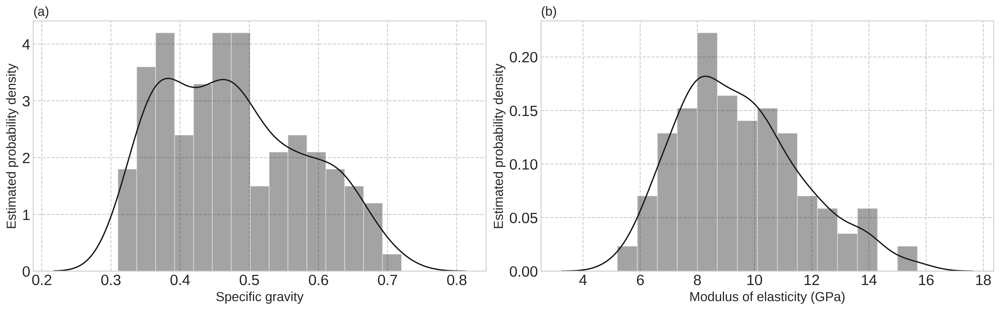

In [13]:
font_label=10
font_title=12
plt.style.use("seaborn-whitegrid")

plt.figure(figsize=(16,5), dpi=400)
for i,j,k,l in zip([1,2],[X_train['Specific gravity'],X_train['Modulus of elasticity (GPa)']],
                                  ['Specific gravity','Modulus of elasticity (GPa)'],
                   ['(a)','(b)']):
    plt.subplot(1,2,i)
    res = sns.distplot(j, bins=15 ,color='k', kde=True, kde_kws={'bw':0.3})
    plt.xlabel(k,fontsize = Size_Title)
    plt.ylabel('Estimated probability density',fontsize = Size_Title)
    plt.grid(linestyle='--')
    plt.tick_params(axis='both', direction='in', labelsize= Size_Axis_Value)
    plt.title(l, loc='left',fontsize= Size_Title)


plt.tight_layout()  # Adjust spacing between subplots
plt.savefig('input-data.png', format='png')

In [14]:
# change the order of the responses and abbreviate columns
def rearrange(dset):
    dset = dset[['Modulus of rupture (MPa)', 'Work to maximum load (MJ/m3)',
                                                'Compression parallel to grain (MPa)',
                                                'Compression perpendicular to grain (MPa)',
                                                'Shear parallel to grain (MPa)', 'Tension perpendicular to grain (MPa)',
                                                'Side hardness (kN)', 'Impact bending (mm)']]
    dset.columns = ['FS (MPa)', 'WML (MJ/m3)', 'CS-P (MPa)', 'CYS-Per (MPa)', 'SS-P (MPa)', 'TS-Per (MPa)', 'SH (kN)', 'IB (mm)']
    return dset

[Y_train, Y_test] = list(map(rearrange, [Y_train, Y_test]))


# Normalaization
X_min_train = X_train[num_preds].min()
X_max_train = X_train[num_preds].max()
Y_min_train = Y_train.min()
Y_max_train = Y_train.max()

X_train_normalized = X_train.copy()
X_train_normalized[num_preds] = (X_train[num_preds] - X_min_train) / (X_max_train - X_min_train)
X_test_normalized = X_test.copy()
X_test_normalized[num_preds] = (X_test[num_preds] - X_min_train) / (X_max_train - X_min_train)


X_train_normalized = pd.concat([X_train[cat_columns], X_train_normalized[num_preds]], axis=1)
X_test_normalized = pd.concat([X_test[cat_columns], X_test_normalized[num_preds]], axis=1)
Y_train_normalized = (Y_train - Y_min_train) / (Y_max_train - Y_min_train)
Y_test_normalized = (Y_test - Y_min_train) / (Y_max_train - Y_min_train)



# mean-center and scale both the design matrix and output variables:
X_train_std = X_train_normalized
X_test_std = X_test_normalized

Y_train_std = Y_train_normalized
Y_test_std = Y_test_normalized

In [15]:
X_train.shape, Y_train.shape, X_test.shape, Y_test.shape

((122, 4), (122, 8), (34, 4), (34, 8))

### Scatterplots, KDEs and Boxplots for the predictor and outcome variables before mean-centering and scaling and after mean-centering and scaling.

Below we create pair plots for numerical variables with controls for `Moisture content` and `Wood type`, thus obtaining the following levels:

| Index  | Meaning   |
| ------ | --------- |
| 0      | Soft Green |
| 1      | Hard Green |
| 2      | Soft Dry  |
| 3      | Hard Dry  |


In [16]:
cdf = pd.concat([X_train_std, Y_train_std], axis=1).rename(columns={'Modulus of elasticity (GPa)': 'MOE (GPa)'})

def segment(vec):
    c1 = vec[0]
    c2 = vec[1]
    if c1==0 and c2==0:
        var = "Hard, Dry"
    elif c1==0 and c2==1:
        var = "Hard, Green"
    elif c1==1 and c2==1:
        var = "Soft, Green"
    else:
        var = "Soft, Dry"
    return var

cdf['Wood subtype']  = cdf[cat_columns].apply(segment, axis=1)

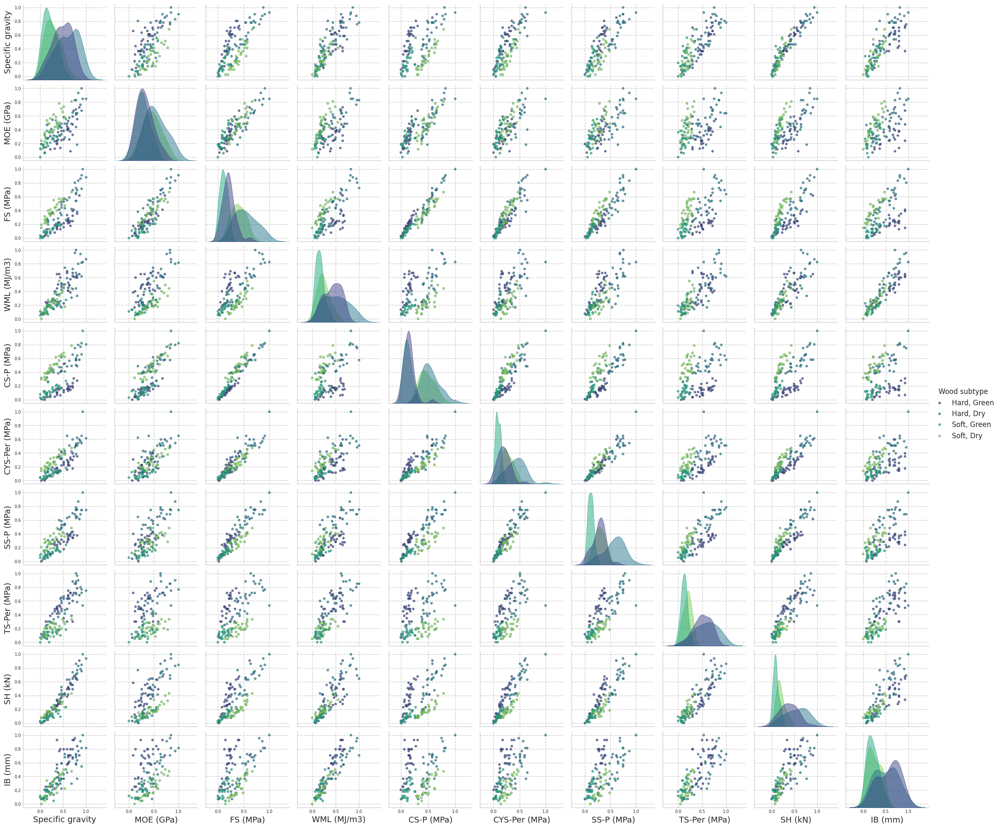

In [17]:
# distributions of numeric variables:
sns.set_style("whitegrid", {'axes.grid' : True, 'grid.linestyle': '--'})
g = sns.PairGrid(cdf.iloc[:, 2:13], hue = "Wood subtype", palette='viridis', diag_sharey=False)
# place kde's on diagonal, scatters off diagonal:
g.map_offdiag(sns.scatterplot, alpha=0.75, s=16, edgecolors='darkslategray')
g.map_diag(sns.kdeplot, fill=True,  alpha=0.5, linewidth=0.5)

g.fig.subplots_adjust(top=0.94)
#g.fig.suptitle('Distributions of Numeric Variables', size=16, y=0.96)
g.add_legend(title="Wood subtype", adjust_subtitles=True, fontsize=12)
g.legend.get_title().set_fontsize('12')
g.fig.set_figheight(21)
g.fig.set_figwidth(24)
for ax in g.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), fontsize=14)
    ax.set_ylabel(ax.get_ylabel(), fontsize=14)

plt.savefig('num_var_dist.png', format='png')

Distributions without subcategories, prior and after log-transformation

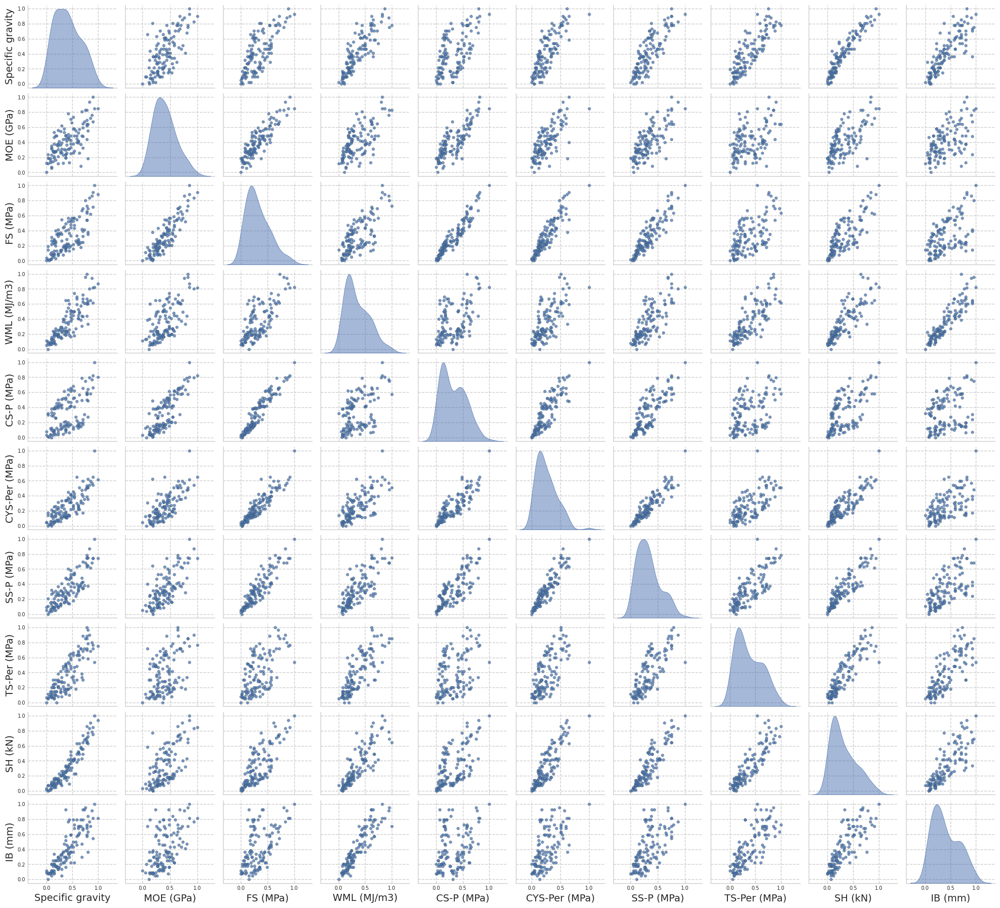

In [18]:
# distributions of numeric variables:
sns.set_style("whitegrid", {'axes.grid' : True, 'grid.linestyle': '--'})
g = sns.PairGrid(cdf.iloc[:, 2:12], palette='viridis', diag_sharey=False)
# place kde's on diagonal, scatters off diagonal:
g.map_offdiag(sns.scatterplot, alpha=0.75, s=16, edgecolors='darkslategray')
g.map_diag(sns.kdeplot, fill=True,  alpha=0.5, linewidth=0.5)

g.fig.subplots_adjust(top=0.94)
#g.fig.suptitle('Distributions of Numeric Variables without log-transform', size=16, y=0.96)
g.fig.set_figheight(19)
g.fig.set_figwidth(20)
for ax in g.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), fontsize=14)
    ax.set_ylabel(ax.get_ylabel(), fontsize=14)

plt.savefig('var-dist-wo-log.png', format = 'png')

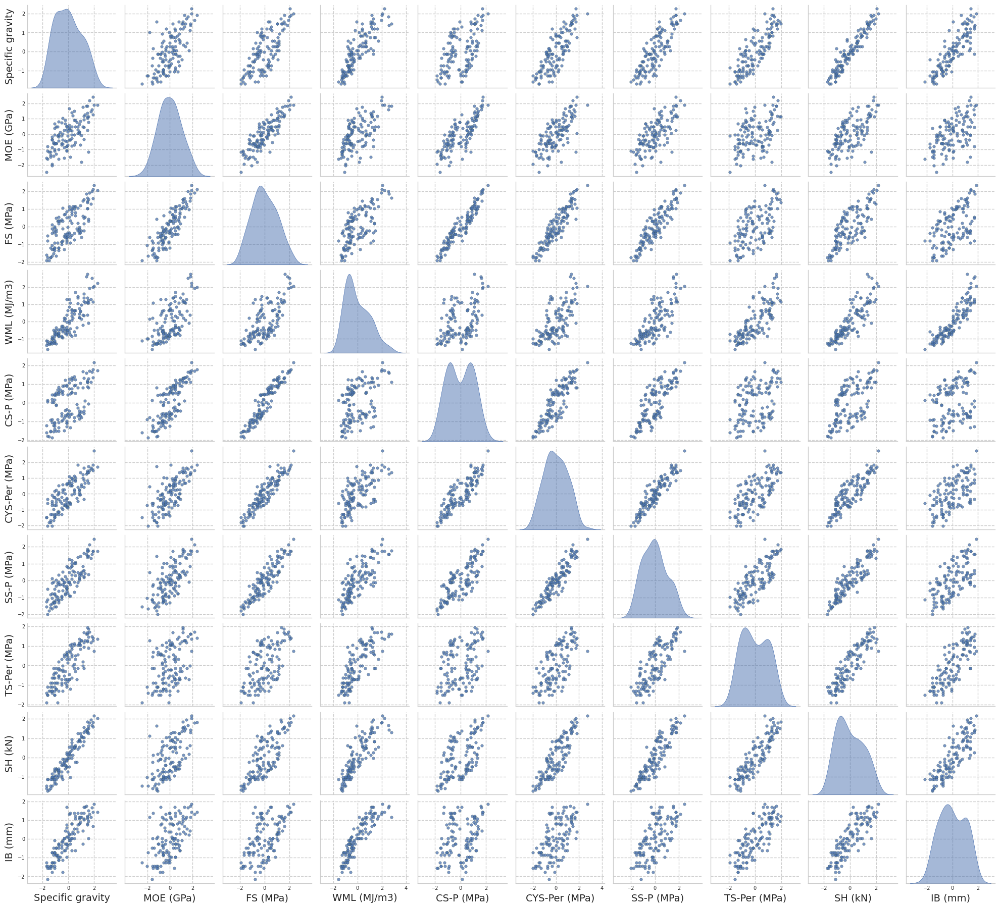

In [19]:
cdf_log = pd.concat([X_train[num_preds], Y_train], axis=1).rename(columns={'Modulus of elasticity (GPa)': 'MOE (GPa)'})
log_v = cdf_log.apply(lambda x: (np.log1p(x)))
stnd_v = log_v.apply(lambda x: (x-np.mean(x))/np.std(x))

# distributions of numeric variables after log-transform:
sns.set_style("whitegrid", {'axes.grid' : True, 'grid.linestyle': '--'})
g = sns.PairGrid(stnd_v.iloc[:, 0:12], palette='viridis', diag_sharey=False)
# place kde's on diagonal, scatters off diagonal:
g.map_offdiag(sns.scatterplot, alpha=0.75, s=16, edgecolors='darkslategray')
g.map_diag(sns.kdeplot, fill=True,  alpha=0.5, linewidth=0.5)

g.fig.subplots_adjust(top=0.94)
#g.fig.suptitle('Distributions of the log-transformed Numeric Variables', size=16, y=0.96)
g.fig.set_figheight(19)
g.fig.set_figwidth(20)
for ax in g.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), fontsize=14)
    ax.set_ylabel(ax.get_ylabel(), fontsize=14)

plt.savefig('var-dist-log.png', format='png')

### Correlations matrix

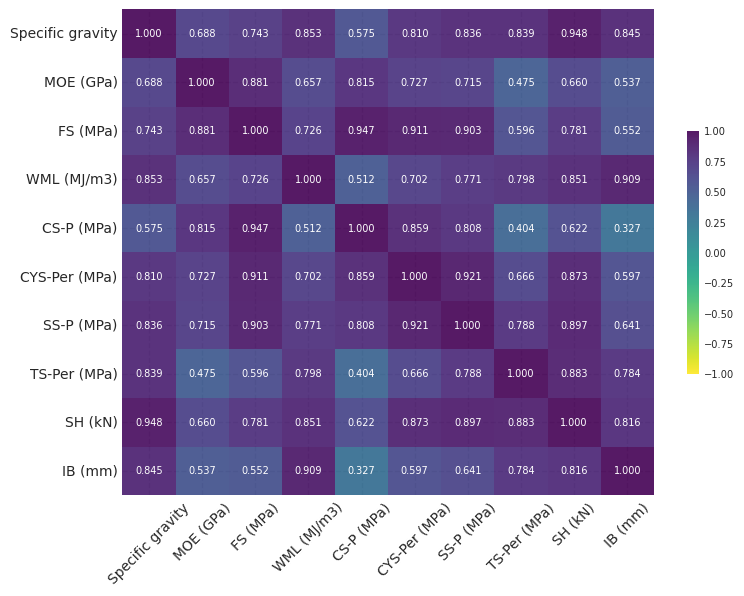

In [20]:
# choose numeric features from the df containing the transformed data:
plt.figure(figsize=(8, 6))
# set the range of values to be displayed on the colormap from -1.0 to 1.0, and set the annotation to True to display the correlation values on the heatmap
heatmap = sns.heatmap(cdf.iloc[:, 2:12].corr(), vmin=-1, vmax=1, annot=True, annot_kws={'fontsize':7}, fmt='.3f', cmap='viridis_r', alpha=0.9, cbar_kws={'shrink': 0.5,})
#heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':13}, pad=6);
plt.xticks(fontsize=10, rotation=45)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.savefig('correlations.png', format='png')
plt.show()

#### Compute VIFs for the (numeric) predictors on the training set
Categorical variables are excluded from the VIF calculations as they do not have a linear relationship with other variables in the same way numeric variables do.

In [21]:
# compute VIFs
vif_data = pd.DataFrame()
vif_data["feature"] = num_preds

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_std[num_preds].values, i)
                          for i in range(len(num_preds))]
display(vif_data)

,feature,VIF
0,Specific gravity,6.745815
1,Modulus of elasticity (GPa),6.745815


The VIF's are not high, multicollinearity should not be an issue.

## 3. Modeling

### 3.1. Multiple linear regression (MLR) with no interactions and no variable transformations

We first fit a linear regression model for each of the response variables of interest separately, with no interaction terms (main effects only) and no additional variable transformations apart from standardization applied to numerical inputs + dummified categorical inputs:

$$
\text{mor}_i = \beta^{\text{mor}}_0 + \beta^{\text{mor}}_1 \times \text{wood_type}_i + \beta^{\text{mor}}_2 \times \text{moist_cont}_i + \beta_3^{\text{mor}} \times \text{spec_grav}_i + \beta^{\text{mor}}_4 \times \text{moe}_i + e_i \\
\vdots\\
\text{side_hrd}_i = \beta^{\text{side_hrd}}_0 + \beta^{\text{side_hrd}}_1 \times \text{wood_type}_i + \beta^{\text{side_hrd}}_2 \times \text{moist_cont}_i + \beta_3^{\text{side_hrd}} \times \text{spec_grav}_i + \beta^{\text{side_hrd}}_4 \times \text{moe}_i + e'_i
$$

In [22]:
# define and fit the regression model:
def run_linreg(col):
    X_train_std_stat, X_test_std_stat = sm.add_constant(X_train_std), sm.add_constant(X_test_std)
    model = sm.OLS(Y_train_std.iloc[:, col], X_train_std_stat).fit()

    # predictions for the train and test data:
    y_hat_train = model.predict(X_train_std_stat)
    y_hat_test = model.predict(X_test_std_stat)

    # reverse the transformation:
    #y_hat_tr = y_hat_train*Y_std_train[col] + Y_mean_train[col]
    #y_hat_tst = y_hat_test*Y_std_train[col] + Y_mean_train[col]

    y_hat_tr = y_hat_train*(Y_train.max()[col]-Y_train.min()[col]) + Y_train.min()[col]  # reverse the transformation
    y_hat_tst = y_hat_test*(Y_train.max()[col]-Y_train.min()[col]) + Y_train.min()[col]  # reverse the transformation


    mae_train = mean_absolute_error(y_hat_tr,  Y_train.iloc[:, col])
    mae_test = mean_absolute_error(y_hat_tst,  Y_test.iloc[:, col])
    # compute RMSE, R squared, adjusted R squared on the train and test data:
    rmse_train = rmse(y_hat_tr,  Y_train.iloc[:, col])
    rmse_test = rmse(y_hat_tst, Y_test.iloc[:, col])

    r_sq_train =  1 - sum((Y_train.iloc[:, col] - y_hat_tr)**2)/sum((Y_train.iloc[:, col] - np.mean(Y_train.iloc[:, col]))**2)
    r_sq_test = 1 - sum((Y_test.iloc[:, col] - y_hat_tst)**2)/sum((Y_test.iloc[:, col] - np.mean(Y_test.iloc[:, col]))**2)

    r_sq_adj_train = 1 - (1-r_sq_train)*(len(Y_train.iloc[:, col])-1)/(len(Y_train.iloc[:, col])-X_train_std_stat.shape[1]-1)
    r_sq_adj_test = 1 - (1-r_sq_test)*(len(Y_test.iloc[:, col])-1)/(len(Y_test.iloc[:, col])-X_test_std_stat.shape[1]-1)

    # compute some additional measures for the diagnostics (for the training data):

    # create instance of influence
    influence = model.get_influence()
    # internal standardized residuals
    standardized_residuals = influence.resid_studentized_internal
    # leverage (hat values)
    leverage = influence.hat_matrix_diag
    # Cook's D values (and p-values) as tuple of arrays
    cooks_d = influence.cooks_distance

    return [y_hat_tst, y_hat_train, standardized_residuals, leverage, cooks_d, mae_test, rmse_test, r_sq_test, r_sq_adj_test, mae_train, rmse_train, r_sq_train, r_sq_adj_train, model]

# list containing results for all 8 individual regressions:
linreg = list(map(run_linreg, np.arange(0, len(Y_train_std.columns))))

### Model performance on the training and test data

In [23]:
mae =  [el[5] for el in linreg]
rmse = [el[6] for el in linreg]
r_sq = [el[7] for el in linreg]
r_sq_adj = [el[8] for el in linreg]
mae_ = [el[9] for el in linreg]
rmse_ = [el[10] for el in linreg]
r_sq_ = [el[11] for el in linreg]
r_sq_adj_ = [el[12] for el in linreg]

# customize styling for displaying the DataFrame:
def color_white(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: gray'` for cases
    where H0 has to be rejected, black otherwise.
    """
    color = 'white' if val > 0.90 else 'gray'
    return 'color: % s' % color

dict_ = {'R squared train': r_sq_, 'R squared adj train': r_sq_adj_, 'MAE train': mae_, 'RMSE train': rmse_, 'R squared test': r_sq, 'R squared adj test': r_sq_adj, 'MAE test': mae, 'RMSE test': rmse}
res = pd.DataFrame(dict_, index=(Y_train_std.columns))
res.style.applymap(color_white, subset=(res.columns[[0,1,4,5]]))

,R squared train,R squared adj train,MAE train,RMSE train,R squared test,R squared adj test,MAE test,RMSE test
FS (MPa),0.939397,0.936784,4.277450,5.569625,0.940244,0.929573,4.252701,5.031849
WML (MJ/m3),0.773190,0.763414,0.009701,0.013016,0.619478,0.551528,0.010629,0.012832
CS-P (MPa),0.937490,0.934795,2.378050,3.159950,0.952671,0.944219,2.272419,2.587705
CYS-Per (MPa),0.866206,0.860439,0.500580,0.744350,0.854615,0.828654,0.626806,0.846661
SS-P (MPa),0.887716,0.882876,0.712604,0.931400,0.880000,0.858571,0.698969,0.868517
TS-Per (MPa),0.823276,0.815659,0.500233,0.642643,0.864174,0.839919,0.398286,0.479126
SH (kN),0.924920,0.921684,0.339378,0.436156,0.905602,0.888745,0.361990,0.429282
IB (mm),0.779796,0.770304,102.726857,134.648633,0.815841,0.782955,76.297912,94.194197


### Diagnostic Plots for the MLR models


NOTE: the diagnostics are for the standardized data.


#### We check for the following assumptions to be satisfied when using the OLS procedure for fitting MLR model):

* $\mathbb{E}[E_i]=0$ (residuals have mean 0),
* $Var(E_i) = \sigma_E^2$ (no heteroscedasticity, i.e. constant variance),
* $Cov(E_i, E_j) = 0, \forall i \ne j$ (no autocorrelation),
* $E_i \sim N(0, \sigma_E^2 I)$, iid (normality).


The first three conditions are necessary for performing least square
estimation and the validity of the fitted values, the last condition is only required for any hypothesis tests, confidence intervals and prediction intervals.

### Diagnostics Plots for the Linear Regression model

#### a. Tuckey-Anscombe Plot

- for checking the linearity assumption;
- for verifying the assumption $\mathbb{E}[E_i]=0$;
- for veryfying the constant variance assumption.

Ideally, the residual plot will show no fitted pattern. That is, the smoothing line should be approximately horizontal at zero. In our example the smoother deviates from the horizontal line taking on a parabolic shape. The presence of a pattern may indicate a problem with some aspect of the linear model, e.g. that power relationship of $moe$ (e.g. $moe^2$) should be included in the model.

#### b. Scale-location Plot

- for verifying the linearity,
- for veryfying the constant variance assumption.

We want to check two things (w.r.t. the bullets above):

  - the smoother is approximately horizontal. Then the average magnitude of the standardized residuals is not changing much as a function of the fitted values,
  - the spread around the red line doesn’t vary with the fitted values. Then the variability of magnitudes doesn’t vary much as a function of the fitted values.

This plot shows if residuals are spread equally along the ranges of predictors. Ideally, the smoother is horizontal, and the points are randomly (uniformly) scattered. In our example, this is not the case (non-linear patterns present).

It can be seen that the variability (variances) of the residual points decreases with the value of the fitted outcome variable, suggesting non-constant variances in the residuals errors (or heteroscedasticity).

A possible solution to reduce the heteroscedasticity problem is to use a log or square root transformation of the outcome variable.

#### c. Leverage Plot

Standardized Residuals are plotted against Leverage (extent to which the coefficients in the regression model would change if a particular observation was removed from the dataset).

- for identifying possible outliers,
- for detecting influential observations.


#### d. Normal QQ-Plot

- for verifying the residulas normality assumption.

The QQ plot of residuals can be used to visually check the normality assumption. The normal probability plot of residuals should approximately follow a straight line.

In our case, the QQ plot demonstrates behavior typical of right-skewed data, with more than "expected" observations in the left tail and less than "expected" in the right tail.

*Right-skewed data*

Right skewed distributions are non-symmetric and have a long tail heading towards extreme values on the right-hand side of the distribution. The mean is more positive than the median.

In the QQ plot, such distributions give a distinctive *convex curvature*. The box-plot may show outliers out towards large values.

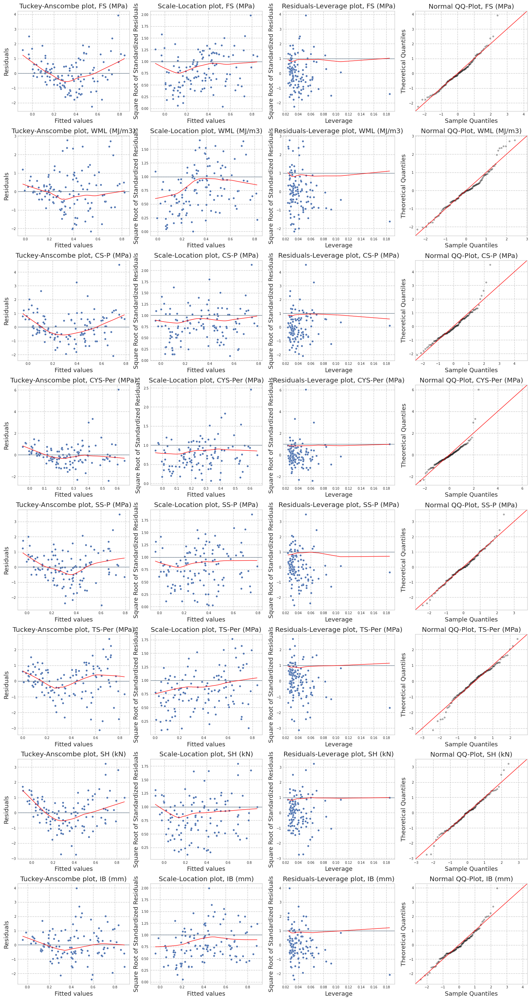

In [24]:
# define diagnostic plots:
def ta_plot(ax, ind):
    sns.scatterplot(data=ds, x="fitted", y="stdresid", s=18, ax=ax)
    ax.axhline(y=0, color="slategrey", linewidth=1)
    ax.set_xlabel("Fitted values", fontsize=13)
    ax.set_ylabel("Residuals", fontsize=13)
    ax.set_title("Tuckey-Anscombe plot, {}".format(Y_train_std.columns[ind]), size=14.5)
    # add locally weighted running line smoother:
    smoothed = sm.nonparametric.lowess(exog=ds['fitted'], endog=ds['stdresid'], frac=0.5)
    ax.plot(smoothed[:, 0], smoothed[:, 1], color='red', linewidth=1)

def scloc_plot(ax, ind):
    sns.scatterplot(data=ds, x="fitted", y="sqrtstdresid", s=18, ax=ax)
    ax.axhline(y=1, color="slategrey", linewidth=1)
    ax.set_xlabel("Fitted values", fontsize=13)
    ax.set_ylabel("Square Root of Standardized Residuals", fontsize=13)
    ax.set_title("Scale-Location plot, {}".format(Y_train_std.columns[ind]), size=14.5)
    # add locally weighted running line smoother:
    smoothed = sm.nonparametric.lowess(exog=ds['fitted'], endog= np.sqrt(np.abs(ds['sqrtstdresid'])), frac=0.5)
    ax.plot(smoothed[:, 0], smoothed[:, 1], color='red', linewidth=1)

def lvg_plot(ax, ind):
    sns.scatterplot(data=ds, x='leverage', y="stdresid", s=18, ax=ax)
    ax.axhline(y=1, color="slategrey", linewidth=1)
    ax.set_xlabel("Leverage", fontsize=13)
    ax.set_ylabel("Square Root of Standardized Residuals", fontsize=13)
    ax.set_title("Residuals-Leverage plot, {}".format(Y_train_std.columns[ind]), size=14.5)
    # add locally weighted running line smoother:
    smoothed = sm.nonparametric.lowess(exog=ds['leverage'], endog= np.sqrt(np.abs(ds['sqrtstdresid'])), frac=0.5)
    ax.plot(smoothed[:, 0], smoothed[:, 1], color='red', linewidth=1)

def qq_plot(ax, ind):
    p = sm.ProbPlot(ds['stdresid'], fit=True)
    q = p.qqplot(marker='.', markerfacecolor='k', markeredgecolor='k', alpha=0.3, ax=ax)
    sm.qqline(q.axes[3+4*ind], line='45', fmt='k--', color="red", linewidth=1)
    ax.set_title("Normal QQ-Plot, {}".format(Y_train_std.columns[ind]), fontsize=14.5)
    ax.set_xlabel("Sample Quantiles", fontsize=13)
    ax.set_ylabel("Theoretical Quantiles", fontsize=13)
# make plots for each of the regressions:

fig, axs = plt.subplots(len(linreg), 4, figsize=(16, 32))
#fig.suptitle("Diagnostic Plots (MLR)", size=16)

for i in range(len(linreg)):
    ds = pd.DataFrame({ 'fitted': linreg[i][1], 'stdresid':linreg[i][2], 'sqrtstdresid':np.sqrt(np.absolute(linreg[i][2])), 'leverage':np.absolute(linreg[i][3])})

    ta_plot(axs[i,0], i)
    scloc_plot(axs[i,1], i)
    lvg_plot(axs[i,2], i)
    qq_plot(axs[i,3], i)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig('diagnostics.png', format='png')
plt.show()

For most of the variables there are clear nonlinear trends present (as can be seen in the Tuckey-Anscombe (Residuls vs. Fitted) plots), in most of the cases the smoother takes on a parabolic shape. This fact suggests that some kind of a power transformation (with power parameter $0<p<1$) might be appropriate.
Some evidence of heteroscedasticity can be seen in the plot Residuls vs. Fitted plot.
We see that some of the observations might have a severe effect on the regression line.
Instead of removing them, one may try to fit a robust regression (with Huber loss).

Considering a log-transformation before normalization (as all numeric variables are also measured on the positive scale)

Run the MLR and the diagnostics for the log-transformed variables.

In [25]:
X_train_log = pd.concat((X_train[cat_columns], stnd_v.iloc[:,0:2]), axis=1)
Y_train_log = stnd_v.iloc[:, 2:12]
cdf_log_ = pd.concat([X_test[num_preds], Y_test], axis=1).rename(columns={'Modulus of elasticity (GPa)': 'MOE (GPa)'})
log_v_ = cdf_log_.apply(lambda x: (np.log1p(x)))
stnd_v_ = log_v_.apply(lambda x: (x-np.mean(x))/np.std(x))
X_test_log = pd.concat((X_test[cat_columns], stnd_v_.iloc[:, 0:2]), axis=1)
Y_test_log = stnd_v_.iloc[:, 2:12]
X_train_log_stat, X_test_log_stat = sm.add_constant(X_train_log), sm.add_constant(X_test_log)

fitted = []
stdresid = []
sqrtstdresid = []
leverage = []

for col in np.arange(0, len(Y_train_log.columns)):

    model = sm.OLS(Y_train_log.iloc[:, col], X_train_log_stat).fit()

    # predictions for the train and test data:
    y_hat_train = model.predict(X_train_log_stat)
    y_hat_test = model.predict(X_test_log_stat)

    # compute some additional measures for the diagnostics (for the training data):
    # create instance of influence
    influence = model.get_influence()
    # internal standardized residuals
    standardized_residuals = influence.resid_studentized_internal
    # leverage (hat values)
    lvg = influence.hat_matrix_diag
    # Cook's D values (and p-values) as tuple of arrays
    cooks_d = influence.cooks_distance

    fitted.append(y_hat_train)
    stdresid.append(standardized_residuals)
    sqrtstdresid.append(np.sqrt(np.absolute(standardized_residuals)))
    leverage.append(np.absolute(lvg))


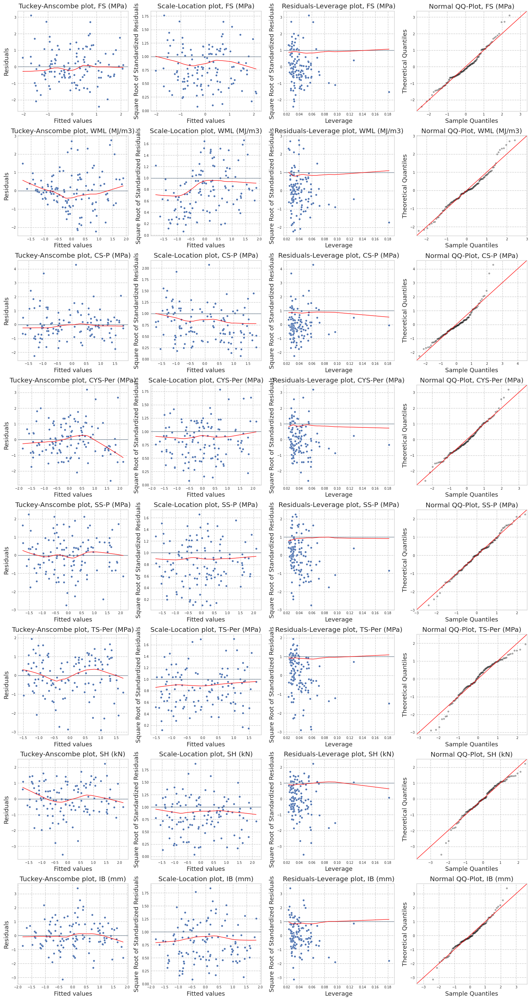

In [26]:
# rerun the diagnostics:
fig, axs = plt.subplots(len(linreg), 4, figsize=(16, 32))
#fig.suptitle("Diagnostic Plots (MLR with log-transformed variables)", size=16)

for i in range(len(linreg)):
    ds = pd.DataFrame({'fitted': fitted[i], 'stdresid': stdresid[i], 'sqrtstdresid': sqrtstdresid[i], 'leverage': leverage[i]})

    ta_plot(axs[i,0], i)
    scloc_plot(axs[i,1], i)
    lvg_plot(axs[i,2], i)
    qq_plot(axs[i,3], i)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig('diagnostics-log.png', format='png')
plt.show()

The diagnostic plot look slightlu better than before, but still unsatisfactory.
We turn our attention to other modeling techniques.

## 3.2. Partial Least Squares (PLS) Regression

We now perform PLS regression on the short design matrix.

In [27]:
start_time_pls = time.time()

model = PLSRegression()
params = {'n_components': [1, 2, 3] }

grid_search = GridSearchCV(model, params, scoring = 'neg_root_mean_squared_error', cv=5)
grid_search.fit(X_train_std, Y_train_std)
best_pls = grid_search.best_estimator_
print(best_pls)

# rerun the model with the best n_components:
best_pls.fit(X_train_std, Y_train_std)

end_time_pls = time.time()
elapsed_time_pls = end_time_pls - start_time_pls


# compute predicted values:
y_hat_train = best_pls.predict(X_train_std)
y_hat_test = best_pls.predict(X_test_std)


# reverse the transformation:
y_hat_tr = pd.DataFrame(y_hat_train, columns = Y_train.columns)
#y_hat_tr = y_hat_tr.mul(Y_std_train, axis=1).add(Y_mean_train, axis=1)
y_hat_tr = y_hat_tr.mul(Y_train.max() - Y_train.min(), axis=1).add(Y_train.min(), axis=1)


y_hat_tst = pd.DataFrame(y_hat_test, columns = Y_train.columns)
#y_hat_tst = y_hat_tst.mul(Y_std_train, axis=1).add(Y_mean_train, axis=1)
y_hat_tst = y_hat_tst.mul(Y_train.max() - Y_train.min(), axis=1).add(Y_train.min(), axis=1)



r_sq_train = r2_score(y_hat_tr, Y_train)
#r_sq_adj_train = 1 - (1-r_sq_train) * (X_train_std.shape[0]-1)/(X_train_std.shape[0] - X_train_std.shape[1] - 1)

r_sq_test = r2_score(y_hat_tst, Y_test)
#r_sq_adj_test = 1 - (1-r_sq_test) * (X_test_std.shape[0]-1)/(X_test_std.shape[0] - X_test_std.shape[1] - 1)

rmse_train = np.sqrt(mean_squared_error(Y_train, y_hat_tr))
rmse_test =  np.sqrt(mean_squared_error(Y_test, y_hat_tst))

mae_train = mean_absolute_error(Y_train, y_hat_tr)
mae_test = mean_absolute_error(Y_test, y_hat_tst)

PLSRegression(n_components=3)


In [28]:
# compute individual goodness-of-fit measures for each of the response variables (test):
r_sq, r_sq_adj, rmse, mae = [], [], [], []

for i in range(Y_test.shape[1]):
    y_true_i = Y_test.to_numpy()[:, i]
    y_pred_i = y_hat_tst.to_numpy()[:, i]

    r_sq_i = r2_score(y_true_i, y_pred_i)
    r_sq_adj_i = 1 - (1-r_sq_i) * (X_test_std.shape[0]-1)/(X_test_std.shape[0] - X_test_std.shape[1] - 1)
    rmse_i = np.sqrt(mean_squared_error(y_true_i, y_pred_i))
    mae_i = mean_absolute_error(y_true_i, y_pred_i)
    r_sq.append(r_sq_i)
    r_sq_adj.append(r_sq_adj_i)
    rmse.append(rmse_i)
    mae.append(mae_i)

# compute individual goodness-of-fit measures for each of the response variables (train):
r_sq_, r_sq_adj_, rmse_, mae_ = [], [], [], []

for i_ in range(Y_train.shape[1]):
    y_true_i_ = Y_train.to_numpy()[:, i_]
    y_pred_i_ = y_hat_tr.to_numpy()[:, i_]

    r_sq_i_ = r2_score(y_true_i_, y_pred_i_)
    r_sq_adj_i_ = 1 - (1-r_sq_i_) * (X_train_std.shape[0]-1)/(X_train_std.shape[0] - X_train_std.shape[1] - 1)
    rmse_i_ = np.sqrt(mean_squared_error(y_true_i_, y_pred_i_))
    mae_i_ = mean_absolute_error(y_true_i_, y_pred_i_)
    r_sq_.append(r_sq_i_)
    r_sq_adj_.append(r_sq_adj_i_)
    rmse_.append(rmse_i_)
    mae_.append(mae_i_)

### Model performance on the training and test sets

In [29]:
dict_ = {'R squared train': r_sq_, 'R squared adj train': r_sq_adj_, 'MAE train': mae_, 'RMSE train': rmse_, 'R squared test': r_sq, 'R squared adj test': r_sq_adj, 'MAE test': mae, 'RMSE test': rmse}
res_ = pd.DataFrame(dict_, index=(Y_train_std.columns))
res_.style.applymap(color_white,  subset=(res.columns[[0,1,4,5]]))

,R squared train,R squared adj train,MAE train,RMSE train,R squared test,R squared adj test,MAE test,RMSE test
FS (MPa),0.938288,0.936178,4.294859,5.620322,0.936395,0.927622,4.338760,5.191353
WML (MJ/m3),0.772728,0.764958,0.009782,0.013029,0.616926,0.564088,0.010749,0.012875
CS-P (MPa),0.933076,0.930788,2.413429,3.269613,0.942224,0.934255,2.493370,2.859066
CYS-Per (MPa),0.802396,0.795640,0.619648,0.904603,0.702935,0.661960,0.927959,1.210252
SS-P (MPa),0.859152,0.854337,0.814799,1.043162,0.809223,0.782908,0.831887,1.095092
TS-Per (MPa),0.812943,0.806548,0.519980,0.661163,0.835113,0.812370,0.435529,0.527898
SH (kN),0.887639,0.883797,0.412594,0.533566,0.781843,0.751752,0.534902,0.652598
IB (mm),0.772241,0.764455,105.636189,136.938831,0.776570,0.745753,84.528541,103.752269


Plot $\mathbf{P}$, the loadings for the $\textbf{X}$ and  $\mathbf{Q}$, the loadings for the $\textbf{Y}$.

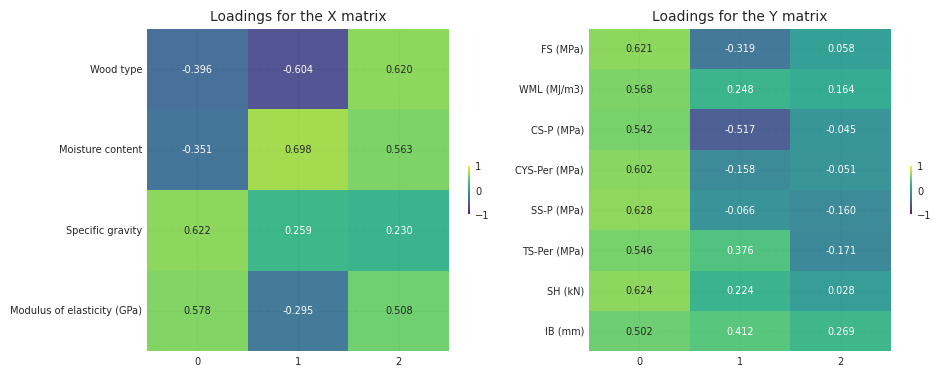

In [30]:
# plot the loadings:
def ldgs_x(ax):
    heatmap = sns.heatmap(best_pls.x_loadings_, vmin=-1, vmax=1, annot=True, annot_kws={'fontsize':7}, fmt='.3f', cmap='viridis', alpha=0.9, cbar_kws={'shrink': 0.15,}, ax=ax1)
    heatmap.set_title('Loadings for the X matrix', fontdict={'fontsize':10}, pad=6);
    plt.xticks(fontsize=7)
    plt.yticks(fontsize=7)

def ldgs_y(ax):
    heatmap = sns.heatmap(best_pls.y_loadings_, vmin=-1, vmax=1, annot=True, annot_kws={'fontsize':7}, fmt='.3f', cmap='viridis', alpha=0.9, cbar_kws={'shrink': 0.15,}, ax=ax2)
    heatmap.set_title('Loadings for the Y matrix', fontdict={'fontsize':10}, pad=6);
    plt.xticks(fontsize=7)
    plt.yticks(fontsize=7)

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ldgs_x(ax1)
ldgs_y(ax2)
ax1.set_yticklabels(list(X_train_std.columns))
ax1.yaxis.set_tick_params(rotation=0)
ax2.set_yticklabels(list(Y_train_std.columns))
ax2.yaxis.set_tick_params(rotation=0)
fig.tight_layout(pad=2.0)
plt.show()

**X-Loadings interpretation attempt:**
* the 1st PC
    * categorical variables `Wood type` and `Moisture content` have almost equal (quite high) negative weights
    * numeric variables `Specific gravity` and `Modulus of elasticity` - with almost equal (quite high) positive weights
* the 2st PC
    * categorical variables `Wood type` and `Modulus of elasticity` have negative weights, the amplitude of `Wood type` dominating
    * numeric variables `Moisture content` and `Specific gravity` have positive weights, with `Moisture content` strongly dominateing (this component might make contrast based on moisture content properties as it also directly affects density)
* the 3d PC
    * all weights are positive
    *  `Wood type`, `Moisture content` and `Modulus of elasticity` contribute in almost equal proportions, `Specific gravity` contributes less (might be some average of all factors).

## 3.3. Random Forest Regression

In [31]:
from sklearn.ensemble import RandomForestRegressor

# run the ElasticNet, using grid search for hyperparameter tuning:
def run_rfr(col):
    params = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10]
    }

    rfr = RandomForestRegressor(random_state=0)

    grid = GridSearchCV(rfr, params, scoring='neg_root_mean_squared_error', cv=5)

    print('-----------------------------')
    print('Random Forest Regression Estimation Results for {}'.format(col))
    print('-----------------------------')
    grid.fit(X_train_std, Y_train_std.iloc[:,col])

    best_est = grid.best_estimator_

    best_model_params = best_est.get_params()
    print("Full Specification of the Best Model:")
    for param_name, param_value in best_model_params.items():
        print(f"{param_name}: {param_value}")
    print()

    # run RFR with the best hyperparameters on the training/test set:
    best_est.fit(X_train_std, Y_train_std.iloc[:,col])
    coefs_ = best_est.feature_importances_

    y_hat_train = best_est.predict(X_train_std)
    y_hat_tr = y_hat_train*(Y_train.max()[col]-Y_train.min()[col]) + Y_train.min()[col]  # reverse the transformation
    rmse_train = np.sqrt(mean_squared_error(Y_train.iloc[:,col], y_hat_tr)) # compute the performance metrics
    mae_train = mean_absolute_error(Y_train.iloc[:,col], y_hat_tr)
    r_sq_train = r2_score(Y_train.iloc[:,col], y_hat_tr)

    y_hat_test = best_est.predict(X_test_std)
    y_hat_tst = y_hat_test*(Y_train.max()[col]-Y_train.min()[col]) + Y_train.min()[col]  # reverse the transformation

    rmse_test = np.sqrt(mean_squared_error(Y_test.iloc[:,col], y_hat_tst)) # compute the performance metrics
    mae_test = mean_absolute_error(Y_test.iloc[:,col], y_hat_tst)
    r_sq_test = r2_score(Y_test.iloc[:,col], y_hat_tst)

    return [y_hat_tst, rmse_train, mae_train, r_sq_train, rmse_test, mae_test, r_sq_test, best_est]

# results for all 8 individual regressions:
start_time_rfr = time.time()
rfr = list(map(run_rfr, np.arange(0, len(Y_train_std.columns))))
end_time_rfr = time.time()
elapsed_time_rfr = end_time_rfr - start_time_rfr

-----------------------------
Random Forest Regression Estimation Results for 0
-----------------------------
Full Specification of the Best Model:
bootstrap: True
ccp_alpha: 0.0
criterion: squared_error
max_depth: None
max_features: 1.0
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 1
min_samples_split: 2
min_weight_fraction_leaf: 0.0
n_estimators: 100
n_jobs: None
oob_score: False
random_state: 0
verbose: 0
warm_start: False

-----------------------------
Random Forest Regression Estimation Results for 1
-----------------------------
Full Specification of the Best Model:
bootstrap: True
ccp_alpha: 0.0
criterion: squared_error
max_depth: None
max_features: 1.0
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 1
min_samples_split: 10
min_weight_fraction_leaf: 0.0
n_estimators: 50
n_jobs: None
oob_score: False
random_state: 0
verbose: 0
warm_start: False

-----------------------------
Random Forest Regression Estimat

### Model performance on the training and test sets

In [32]:
rmse_ = [el[1] for el in rfr]
mae_ = [el[2] for el in rfr]
r_sq_ = [el[3] for el in rfr]
rmse = [el[4] for el in rfr]
mae = [el[5] for el in rfr]
r_sq = [el[6] for el in rfr]

dict_ = {'R squared train': r_sq_, 'MAE train': mae_, 'RMSE train': rmse_, 'R squared test': r_sq, 'MAE test': mae, 'RMSE test': rmse}
res = pd.DataFrame(dict_, index=(Y_train_std.columns))
res#.style.applymap(color_white,  subset=(res.columns[[0,3]]))

,R squared train,MAE train,RMSE train,R squared test,MAE test,RMSE test
FS (MPa),0.991009,1.632971,2.145230,0.925858,4.254889,5.604890
WML (MJ/m3),0.863383,0.007301,0.010102,0.684055,0.009212,0.011692
CS-P (MPa),0.977090,1.440777,1.912998,0.924620,2.731718,3.265720
CYS-Per (MPa),0.920917,0.384846,0.572272,0.830480,0.661011,0.914239
SS-P (MPa),0.946181,0.487626,0.644831,0.893431,0.646818,0.818470
TS-Per (MPa),0.951843,0.252005,0.335468,0.836117,0.449158,0.526290
SH (kN),0.988804,0.124980,0.168430,0.955193,0.240785,0.295758
IB (mm),0.861168,78.003282,106.913815,0.787510,82.170808,101.180354


## 3.4. Support Vector Regression (models fit independently)

In [33]:
# run the SVR, using grid search for hyperparameter tuning:
def run_svr(col):
    params = {'C': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              'kernel': ['rbf', 'poly'],
              'gamma': ['scale', 'auto'],
              'epsilon': [0.0005, 0.00075, 0.001, 0.00125, 0.0015, 0.00175, 0.005, 0.01, 0.025, 0.05],
              }

    svr = SVR()
    svr.random_state = 0
    grid = GridSearchCV(svr, params, scoring='neg_root_mean_squared_error', cv=5)

    print('-----------------------------')
    print('SVR Estimation Results for {}'.format(col))
    print('-----------------------------')
    grid.fit(X_train_std, Y_train_std.iloc[:,col])

    best_est = grid.best_estimator_

    best_model_params = best_est.get_params()
    print('Full Specification of the Best Model:')
    for param_name, param_value in best_model_params.items():
        print(f'{param_name}: {param_value}')

    # prediction and performacne on the training and test sets:
    best_est.fit(X_train_std, Y_train_std.iloc[:,col])
    coefs_ = best_est.dual_coef_

    y_hat_train = best_est.predict(X_train_std)
    y_hat_tr = y_hat_train*(Y_train.max()[col]-Y_train.min()[col]) + Y_train.min()[col]  # reverse the transformation
    r2_train = r2_score(Y_train.iloc[:,col], y_hat_tr) # compute the performance metrics
    rmse_train = np.sqrt(mean_squared_error(Y_train.iloc[:,col], y_hat_tr)) # compute the performance metrics
    mae_train = mean_absolute_error(Y_train.iloc[:,col], y_hat_tr)

    y_hat_test = best_est.predict(X_test_std)
    y_hat_tst = y_hat_test*(Y_train.max()[col]-Y_train.min()[col]) + Y_train.min()[col]  # reverse the transformation
    r2_test = r2_score(Y_test.iloc[:,col], y_hat_tst) # compute the performance metrics
    rmse_test = np.sqrt(mean_squared_error(Y_test.iloc[:,col], y_hat_tst)) # compute the performance metrics
    mae_test = mean_absolute_error(Y_test.iloc[:,col], y_hat_tst)

    return [y_hat_tst, r2_train, rmse_train, mae_train,r2_test, rmse_test, mae_test, best_est]


# results for all 8 individual regressions:
start_time_svr = time.time()
svr = list(map(run_svr, np.arange(0, len(Y_train_std.columns))))
end_time_svr = time.time()
elapsed_time_svr = end_time_svr - start_time_svr

-----------------------------
SVR Estimation Results for 0
-----------------------------
Full Specification of the Best Model:
C: 3
cache_size: 200
coef0: 0.0
degree: 3
epsilon: 0.05
gamma: auto
kernel: rbf
max_iter: -1
shrinking: True
tol: 0.001
verbose: False
-----------------------------
SVR Estimation Results for 1
-----------------------------
Full Specification of the Best Model:
C: 0.4
cache_size: 200
coef0: 0.0
degree: 3
epsilon: 0.005
gamma: scale
kernel: rbf
max_iter: -1
shrinking: True
tol: 0.001
verbose: False
-----------------------------
SVR Estimation Results for 2
-----------------------------
Full Specification of the Best Model:
C: 4
cache_size: 200
coef0: 0.0
degree: 3
epsilon: 0.01
gamma: auto
kernel: rbf
max_iter: -1
shrinking: True
tol: 0.001
verbose: False
-----------------------------
SVR Estimation Results for 3
-----------------------------
Full Specification of the Best Model:
C: 10
cache_size: 200
coef0: 0.0
degree: 3
epsilon: 0.0005
gamma: auto
kernel: rbf


### Model performance on the training and test sets

In [38]:
r2_ = [el[1] for el in svr]
rmse_ = [el[2] for el in svr]
mae_ = [el[3] for el in svr]
r2 = [el[4] for el in svr]
rmse = [el[5] for el in svr]
mae = [el[6] for el in svr]

dict_ = {'r2 train': r2_, 'MAE train': mae_, 'RMSE train': rmse_, 'r2 test': r2,'MAE test': mae, 'RMSE test': rmse}
res = pd.DataFrame(dict_, index=(Y_train_std.columns))
res.style.applymap(color_white, subset=(res.columns[[]]))

,r2 train,MAE train,RMSE train,r2 test,MAE test,RMSE test
FS (MPa),0.957421,3.659497,4.668471,0.945613,4.134310,4.800458
WML (MJ/m3),0.802601,0.008317,0.012143,0.742915,0.007809,0.010547
CS-P (MPa),0.952141,1.796887,2.764929,0.957720,1.869338,2.445790
CYS-Per (MPa),0.881646,0.393497,0.700086,0.859454,0.548382,0.832453
SS-P (MPa),0.916820,0.588713,0.801654,0.889506,0.660948,0.833404
TS-Per (MPa),0.863585,0.409182,0.564616,0.861534,0.385016,0.483760
SH (kN),0.960761,0.223711,0.315312,0.955108,0.224405,0.296036
IB (mm),0.824008,81.376886,120.374773,0.837164,76.796468,88.573221


## 3.5. `SVR()` combined with `RegressorChain`

In [35]:
from sklearn.multioutput import RegressorChain

base_estimator = SVR(kernel='rbf')
base_estimator.random_state = 0
regressor_chain = RegressorChain(base_estimator)

start_time_svrrc = time.time()
# set up parameter grid:
params = {
          'base_estimator__C': [0.001, 0.01, 0.1, 0.5, 1, 5, 10, 20, 30],
          'base_estimator__epsilon': [0.00001, 0.0001, 0.001, 0.01, 0.005, 0.1, 1, 10],
          'base_estimator__gamma': ['scale', 'auto']
          }

grid = GridSearchCV(regressor_chain, params, cv=5)
grid.fit(X_train_std, Y_train_std)

best_svr = grid.best_estimator_
best_svr.fit(X_train_std, Y_train_std)
best_model_params = best_svr.get_params()
print('Full Specification of the Best Model:')
for param_name, param_value in best_model_params.items():
    print(f'{param_name}: {param_value}')

end_time_svrrc = time.time()
elapsed_time_svrrc = end_time_svrrc - start_time_svrrc


# evaluate on the training data:
Y_hat_train = best_svr.predict(X_train_std)
# reverse the transformation:
Y_hat_tr = pd.DataFrame(Y_hat_train, columns = Y_train.columns)
#Y_hat_tr = Y_hat_tr.mul(Y_std_train, axis=1).add(Y_mean_train, axis=1)
Y_hat_tr = Y_hat_tr.mul(Y_train.max() - Y_train.min(), axis=1).add(Y_train.min(), axis=1)
rmse_train = np.sqrt(mean_squared_error(Y_train, Y_hat_tr))
mae_train = mean_absolute_error(Y_train, Y_hat_tr)


# evaluate on the test data:
Y_hat_test = best_svr.predict(X_test_std)
Y_hat_tst = pd.DataFrame(Y_hat_test, columns = Y_train.columns)
#Y_hat_tst = Y_hat_tst.mul(Y_std_train, axis=1).add(Y_mean_train, axis=1)
Y_hat_tst = Y_hat_tst.mul(Y_train.max() - Y_train.min(), axis=1).add(Y_train.min(), axis=1)
rmse_test = np.sqrt(mean_squared_error(Y_test, Y_hat_tst))
mae_test = mean_absolute_error(Y_test, Y_hat_tst)

# obtain individual scores:
indiv_r2_train, indiv_rmse_train, indiv_rmse_test = [], [], []
indiv_r2_test, indiv_mae_train, indiv_mae_test = [], [], []
X_train_std_, X_test_std_ = X_train_std.to_numpy(),  X_test_std.to_numpy()

for i, estimator in enumerate(best_svr.estimators_):
    # each successive prediction uses the previous prediction as an input:
    y_hat_single_train = estimator.predict(X_train_std_).reshape(-1, 1)
    X_train_std_ = np.append(X_train_std_, y_hat_single_train, axis=1)

    y_hat_single_test = estimator.predict(X_test_std_).reshape(-1, 1)
    X_test_std_ = np.append(X_test_std_, y_hat_single_test, axis=1)


    # reverse the transformation:
    #y_hat_single_tr =  y_hat_single_train*Y_std_train[i] + Y_mean_train[i]
    #y_hat_single_tst = y_hat_single_test*Y_std_train[i] + Y_mean_train[i]


    y_hat_single_tr = y_hat_single_train*(Y_train.max()[i] - Y_train.min()[i])+(Y_train.min()[i])
    y_hat_single_tst = y_hat_single_test*(Y_train.max()[i] - Y_train.min()[i])+(Y_train.min()[i])


    # compute r2:
    r2_single_train = r2_score(Y_train.to_numpy()[:, i], y_hat_single_tr)
    r2_single_test = r2_score(Y_test.to_numpy()[:, i], y_hat_single_tst)
    indiv_r2_train.append(r2_single_train)
    indiv_r2_test.append(r2_single_test)

    # compute errors:
    rmse_single_train = np.sqrt(mean_squared_error(Y_train.to_numpy()[:, i], y_hat_single_tr))
    rmse_single_test = np.sqrt(mean_squared_error(Y_test.to_numpy()[:, i], y_hat_single_tst))
    indiv_rmse_train.append(rmse_single_train)
    indiv_rmse_test.append(rmse_single_test)

    mae_single_train = mean_absolute_error(Y_train.to_numpy()[:, i], y_hat_single_tr)
    mae_single_test = mean_absolute_error(Y_test.to_numpy()[:, i], y_hat_single_tst)
    indiv_mae_train.append(mae_single_train)
    indiv_mae_test.append(mae_single_test)

# Print individual scores
# for i, score in enumerate(indiv_rmse_train):
#     print(f"Regressor {i+1} Score: {score}")

Full Specification of the Best Model:
base_estimator__C: 5
base_estimator__cache_size: 200
base_estimator__coef0: 0.0
base_estimator__degree: 3
base_estimator__epsilon: 0.01
base_estimator__gamma: auto
base_estimator__kernel: rbf
base_estimator__max_iter: -1
base_estimator__shrinking: True
base_estimator__tol: 0.001
base_estimator__verbose: False
base_estimator: SVR(C=5, epsilon=0.01, gamma='auto')
cv: None
order: None
random_state: None
verbose: False


## Model performance on the training and test sets

In [36]:
dict_ = {'R2 train': indiv_r2_train, 'MAE train': indiv_mae_train, 'RMSE train': indiv_rmse_train, 'R2 test': indiv_r2_test, 'MAE test': indiv_mae_test, 'RMSE test': indiv_rmse_test}
res = pd.DataFrame(dict_, index=(Y_train_std.columns))
res.style.applymap(color_white, subset=(res.columns[[]]))

,R2 train,MAE train,RMSE train,R2 test,MAE test,RMSE test
FS (MPa),0.959340,3.167251,4.562056,0.956919,3.282108,4.272446
WML (MJ/m3),0.798319,0.008710,0.012274,0.735653,0.008062,0.010695
CS-P (MPa),0.951752,1.835747,2.776161,0.953655,1.941404,2.560677
CYS-Per (MPa),0.883416,0.423951,0.694831,0.863068,0.559685,0.821678
SS-P (MPa),0.918156,0.569002,0.795190,0.895745,0.645404,0.809533
TS-Per (MPa),0.859992,0.408376,0.572002,0.877053,0.355942,0.455845
SH (kN),0.959761,0.235733,0.319303,0.957055,0.224969,0.289546
IB (mm),0.817475,86.532153,122.588531,0.848465,69.027774,85.444384


The performance with the `RegressorChain` approach provides only slightly better results (both RMSE and MAE are by $\approx 0.002$) higer than for the `MultiOutputRegressor`. The models for each of the responses can be fit independently as there is no evident benefit in fitting them trying to account for conditional dependence.


Possible reasons:
The output variables can still incorporate some relevant information for predicting the other response variables, but
* the high proportion of variance is explained by the 4 predictors (so there is much confounding)
* regressor chains do not work perfectly (useful information is partially lost, and no transfer is happening) [provide reference to Read's work on chain regressors].

## 4. Results Analysis

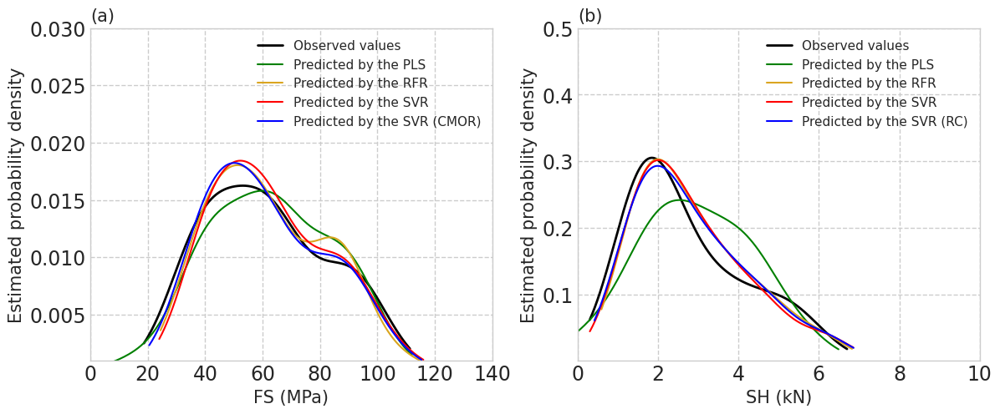

In [37]:
# visualize the performance of the models on the test set (KDEs of the predicted values)
#font_size = 12
#font_label = 10

def predict_train(method):
    # predicted values (test):
    if method == 'MLR':
        predicted_train = pd.DataFrame.from_dict(dict(zip(Y_train.columns, [el[0] for el in linreg])))
    if method == 'PLS':
        predicted_train = y_hat_tr
    if method == 'RFR':
        predicted_train = pd.DataFrame.from_dict(dict(zip(Y_train.columns, [el[0] for el in rfr])))
    if method == 'SVR':
        predicted_train = pd.DataFrame.from_dict(dict(zip(Y_train.columns, [el[0] for el in svr])))
    if method == 'SVRC':
        predicted_train = Y_hat_tr
    predicted_train['Method'] = method
    return predicted_train



def predict(method):
    # predicted values (test):
    if method == 'MLR':
        predicted_test = pd.DataFrame.from_dict(dict(zip(Y_test.columns, [el[0] for el in linreg])))
    if method == 'PLS':
        predicted_test = y_hat_tst
    if method == 'RFR':
        predicted_test = pd.DataFrame.from_dict(dict(zip(Y_test.columns, [el[0] for el in rfr])))
    if method == 'SVR':
        predicted_test = pd.DataFrame.from_dict(dict(zip(Y_test.columns, [el[0] for el in svr])))
    if method == 'SVRC':
        predicted_test = Y_hat_tst
    predicted_test['Method'] = method
    return predicted_test

plt.figure(figsize=(12, 5))
plt.subplot(1,2,1)
ax1 = sns.kdeplot(Y_test['FS (MPa)'], color="black", linewidth=2, label="Observed values", cut=1)

#sns.kdeplot(predict('MLR')['FS (MPa)'],  color='#440154ff', label="Predicted by the MLR" , cut=1);
sns.kdeplot(predict('PLS')['FS (MPa)'],  color='green', label="Predicted by the PLS" , cut=1); # '#414487ff'
sns.kdeplot(predict('RFR')['FS (MPa)'],  color='goldenrod', label="Predicted by the RFR" , cut=1); # '#2a788eff'
sns.kdeplot(predict('SVR')['FS (MPa)'],  color='red', label="Predicted by the SVR" , cut=1); # '#22a884ff
sns.kdeplot(predict('SVRC')['FS (MPa)'],  color='blue', label="Predicted by the SVR (CMOR)" , cut=1); # '#7ad151ff'


x_dis = ax1.lines[0].get_xdata()
y_dis = ax1.lines[0].get_ydata()
df_dis=pd.DataFrame((x_dis,y_dis)).T
ax1.tick_params(axis='both', direction='in')
plt.xlabel('FS (MPa)', fontsize = Size_Title)
plt.ylabel('Estimated probability density', fontsize = Size_Title)
plt.title('(a)', loc='left', fontsize = Size_Title)
plt.grid(linestyle='--')
plt.legend(fontsize = Size_Legend)
plt.xlim(0, 140)#Y_test['FS (MPa)'].max()*1.6)
plt.ylim(0.001, 0.03)#y_dis.max()*2)
plt.xticks(fontsize=Size_Axis_Value)
plt.yticks(fontsize=Size_Axis_Value)


plt.subplot(1,2,2)
ax2 = sns.kdeplot(Y_test['SH (kN)'], color="black", linewidth=2, label="Observed values", cut=1)
#sns.kdeplot(predict('MLR')['SH (kN)'],  color='#440154ff', label="Predicted by the MLR" , cut=1);
sns.kdeplot(predict('PLS')['SH (kN)'],  color='green', label="Predicted by the PLS" , cut=1); # '#414487ff'
sns.kdeplot(predict('RFR')['SH (kN)'],  color='goldenrod', label="Predicted by the RFR" , cut=1); # '#2a788eff'
sns.kdeplot(predict('SVR')['SH (kN)'],  color='red', label="Predicted by the SVR" , cut=1); # '#22a884ff
sns.kdeplot(predict('SVRC')['SH (kN)'],  color='blue', label="Predicted by the SVR (RC)" , cut=1); # '#7ad151ff'


x_dis = ax2.lines[0].get_xdata()
y_dis = ax2.lines[0].get_ydata()
df_dis=pd.DataFrame((x_dis,y_dis)).T
ax2.tick_params(axis='both', direction='in', size= Size_Axis_Value)
plt.xlabel('SH (kN)', fontsize = Size_Title)
plt.ylabel('Estimated probability density', fontsize = Size_Title)
plt.title('(b)', loc='left', fontsize = Size_Title)
plt.grid(linestyle='--')
plt.legend(fontsize = Size_Legend)
plt.xlim(0, 10)#Y_test['SH (kN)'].max()*1.6)
plt.ylim(0.001, 0.5)#y_dis.max()*2)
plt.xticks(fontsize=Size_Axis_Value)
plt.yticks(fontsize=Size_Axis_Value)
plt.tight_layout()  # Adjust spacing between subplots
plt.savefig('dens-dist-comparison.png', format='png')
plt.show()

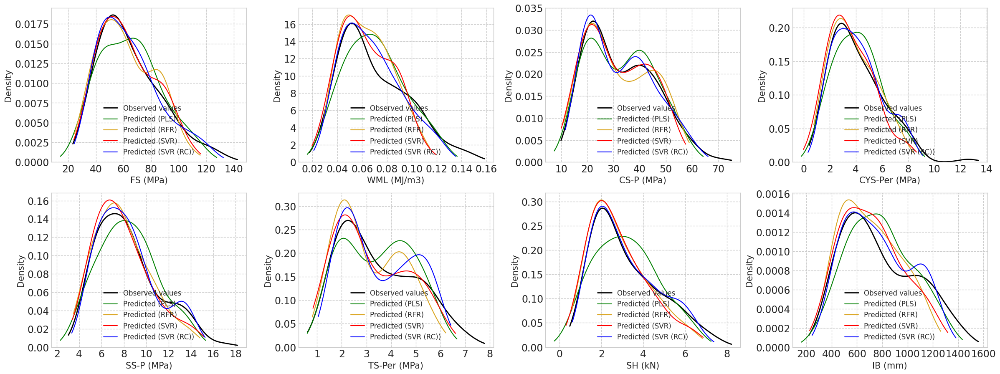

In [39]:
observed = Y_test.copy()
observed['Method'] = 'Observed values'
cd = pd.concat([observed, predict('MLR'), predict('PLS'), predict('RFR'), predict('SVR'), predict('SVRC')], axis=0)


# imputed vs. complete distributions:
fig, ax = plt.subplots(2, 4, figsize=(24, 9))
ax = ax.flatten()

for i, column in enumerate(list(cd.columns[:-1])):
    plot_axes = [ax[i]]

    sns.kdeplot(Y_train[column], color="black", linewidth=2, label="Observed values", ax=ax[i], cut=1)
    #sns.kdeplot(predict('MLR')[column],  color='#440154ff', label="Predicted (MLR)" , ax=ax[i], cut=1);
    sns.kdeplot(predict_train('PLS')[column],  color='green', label="Predicted (PLS)" , ax=ax[i], cut=1);
    sns.kdeplot(predict_train('RFR')[column],  color='goldenrod', label="Predicted (RFR)" , ax=ax[i], cut=1);
    sns.kdeplot(predict_train('SVR')[column],  color='red', label="Predicted (SVR)" , ax=ax[i], cut=1);
    sns.kdeplot(predict_train('SVRC')[column],  color='blue', label="Predicted (SVR (RC))" , ax=ax[i], cut=1);

    x_dis = ax[i].lines[0].get_xdata()
    y_dis = ax[i].lines[0].get_ydata()
    df_dis=pd.DataFrame((x_dis,y_dis)).T
    plt.tick_params(axis='both', direction='in')
    ax[i].legend(fontsize= Size_Legend+1, loc=8)
    # titles
    #ax[i].set_title(f'{column}', fontsize= Size_Tilte);
    ax[i].set_xlabel(f'{column}',  fontsize= Size_Title)
    ax[i].set_ylabel('Density', fontsize= Size_Title)
    # rotate ticks
    ax[i].set_xticklabels(ax[i].get_xticklabels(), size = Size_Axis_Value)
    ax[i].set_yticklabels(ax[i].get_yticklabels(), size = Size_Axis_Value)
    #ax[i].set_ylim(0, 2.5*y_dis.max())

for i in range(i+1, len(ax)):
    ax[i].axis('off')

#plt.suptitle('Distributions of the predicted values on the test set', size=16)
plt.savefig('dist-comparison.png', format='png')

plt.tight_layout()
plt.show()

### For SVR (CMOR) only

In [40]:
list(Y_test.columns)

['FS (MPa)',
 'WML (MJ/m3)',
 'CS-P (MPa)',
 'CYS-Per (MPa)',
 'SS-P (MPa)',
 'TS-Per (MPa)',
 'SH (kN)',
 'IB (mm)']

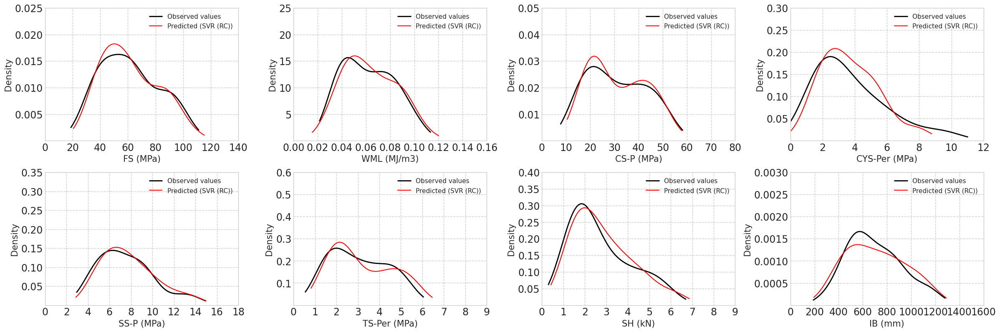

In [41]:
fig, ax = plt.subplots(2, 4, figsize=(24, 8))
ax = ax.flatten()

for i, column,k, j in zip(np.arange(len(Y_test.columns)),list(Y_test.columns),
                          [140, 0.16, 80, 12, 18,9, 9, 1600],
                          [0.025, 25, 0.05, 0.3, 0.35, 0.6, 0.4, 0.003]):
    #plot_axes = [ax[i]]

    ##########################################################################################
    ax[i] = sns.kdeplot(Y_test[column], color="black", linewidth=2, label="Observed values", ax=ax[i], cut=1)
    ##########################################################################################
    #mask = Y_test.index.isin(X_test.index[X_test["Wood type"]==1].tolist())
    #sns.kdeplot(Y_test.iloc[:,i][mask].tolist(), color="red", linestyle="--", linewidth=1, label="Observed values (Soft)", ax=ax[i], cut=2)
    #sns.kdeplot(Y_test.iloc[:,i][~mask].tolist(), color="red", linestyle="-.", linewidth=1, label="Observed values (Hard)", ax=ax[i], cut=2)

    #mask = Y_test.index.isin(X_test.index[X_test["Moisture content"]==0].tolist())
    #sns.kdeplot(Y_test.iloc[:,i][mask].tolist(), color="green", linestyle="--", linewidth=1, label="Observed values (Green)", ax=ax[i], cut=2)
    #sns.kdeplot(Y_test.iloc[:,i][~mask].tolist(), color="green", linestyle="-.", linewidth=1, label="Observed values (Dry)", ax=ax[i], cut=2)

    sns.kdeplot(predict('SVRC')[column],  color='red', label="Predicted (SVR (RC))" , ax=ax[i], cut=1);
    ##########################################################################################
    ax[i].set_xlim(0.0,k)
    ax[i].set_ylim(0.000001,j)

    #x_dis = ax[i].lines[0].get_xdata()
    #y_dis = ax[i].lines[0].get_ydata()
    #df_dis=pd.DataFrame((x_dis,y_dis)).T
    plt.tick_params(axis='both', direction='in')
    ax[i].legend(fontsize= Size_Legend, loc=1)
    # titles
    # ax[i].set_title(f'{column}', fontsize=14.5);
    ax[i].set_xlabel(f'{column}', fontsize= Size_Title)
    ax[i].set_ylabel('Density', fontsize= Size_Title)
    # rotate ticks
    ax[i].set_xticklabels(ax[i].get_xticklabels(), size = Size_Axis_Value)
    ax[i].set_yticklabels(ax[i].get_yticklabels(), size = Size_Axis_Value)

#for i in range(i+1, len(ax)):
#    ax[i].axis('off')

#plt.suptitle('Distributions of the predicted values on the test set', size=16)
plt.tight_layout()
plt.savefig('dist-est-svr.png', format= 'png')

Radar plots

In [42]:
predict_train('SVRC')

,FS (MPa),WML (MJ/m3),CS-P (MPa),CYS-Per (MPa),SS-P (MPa),TS-Per (MPa),SH (kN),IB (mm),Method
0,41.391329,0.053422,17.698435,1.525115,5.163881,2.770163,1.710989,602.375642,SVRC
1,64.813966,0.056953,35.716994,3.551137,8.242871,3.264502,2.427863,572.125533,SVRC
2,49.683972,0.075551,20.951803,3.313599,7.604504,4.387092,3.383050,953.918987,SVRC
3,78.829738,0.078979,41.168692,6.096043,11.438341,4.823190,4.410474,834.810791,SVRC
4,59.384852,0.087828,25.044437,3.986295,8.383521,4.903450,4.213823,1090.694933,SVRC
...,...,...,...,...,...,...,...,...,...
117,72.973574,0.056667,40.897128,4.045316,7.750282,2.253010,2.283417,589.533461,SVRC
118,39.944523,0.042648,19.574618,1.950300,5.315021,1.898355,1.511609,512.477178,SVRC
119,66.203544,0.049959,38.286586,4.036214,7.559009,2.262783,2.143836,530.179311,SVRC
120,50.994676,0.057457,24.958582,2.943709,6.560325,2.536786,2.296493,747.080611,SVRC


In [43]:
r2_pls = list(map(lambda i: r2_score(Y_test.iloc[:, i], predict('PLS').iloc[:, i]), list(np.arange(8))))
r2_rfr = list(map(lambda i: r2_score(Y_test.iloc[:, i], predict('RFR').iloc[:, i]), list(np.arange(8))))
r2_svr = list(map(lambda i: r2_score(Y_test.iloc[:, i], predict('SVR').iloc[:, i]), list(np.arange(8))))
r2_svrc = list(map(lambda i: r2_score(Y_test.iloc[:, i], predict('SVRC').iloc[:, i]), list(np.arange(8))))

rmse_pls = list(map(lambda i: np.sqrt(mean_squared_error(Y_test.iloc[:, i], predict('PLS').iloc[:, i])), list(np.arange(8))))
rmse_rfr = list(map(lambda i: np.sqrt(mean_squared_error(Y_test.iloc[:, i], predict('RFR').iloc[:, i])), list(np.arange(8))))
rmse_svr = list(map(lambda i: np.sqrt(mean_squared_error(Y_test.iloc[:, i], predict('SVR').iloc[:, i])), list(np.arange(8))))
rmse_svrc = list(map(lambda i: np.sqrt(mean_squared_error(Y_test.iloc[:, i], predict('SVRC').iloc[:, i])), list(np.arange(8))))


#mode_obs = list(map(lambda i: (stats.mode(Y_test.iloc[:, i])[0]/stats.mode(Y_test.iloc[:, i])[0]*100).round(4), list(np.arange(8))))
#mode_pls = list(map(lambda i: (stats.mode(predict('PLS').iloc[:, i])[0]/stats.mode(Y_test.iloc[:, i])[0]*100).round(4), list(np.arange(8))))
#mode_rfr = list(map(lambda i: (stats.mode(predict('RFR').iloc[:, i])[0]/stats.mode(Y_test.iloc[:, i])[0]*100).round(4), list(np.arange(8))))
#mode_svr = list(map(lambda i: (stats.mode(predict('SVR').iloc[:, i])[0]/stats.mode(Y_test.iloc[:, i])[0]*100).round(4), list(np.arange(8))))
#mode_svrc = list(map(lambda i: (stats.mode(predict('SVRC').iloc[:, i])[0]/stats.mode(Y_test.iloc[:, i])[0]*100).round(4), list(np.arange(8))))

############## Vahid
def make_percentage (exp,pred):
    return (100*np.array(pred)/np.array(exp)).round(4)

def statistic (y_test):
    from scipy.stats import norm, skew, kurtosis
    from scipy.stats import gaussian_kde
    density_exp = gaussian_kde(y_test)
    x_exp = np.linspace(min(y_test), max(y_test), 100)
    y_exp = density_exp(x_exp)
    df_exp=pd.DataFrame((x_exp,y_exp)).T
    Mode=df_exp[df_exp[1]==max(df_exp[1])].reset_index(drop=True)[0][0]
    skew=skew(y_exp)
    kurtosis=kurtosis(y_exp,fisher=False)
    return [Mode, skew, kurtosis]

mode_obs_values=list(map(lambda i: (statistic(Y_test.iloc[:, i])[0]), list(np.arange(8))))
mode_obs=make_percentage(list(map(lambda i: (statistic(Y_test.iloc[:, i])[0]), list(np.arange(8)))),mode_obs_values)
mode_pls=make_percentage(list(map(lambda i: (statistic(predict('PLS').iloc[:, i])[0]), list(np.arange(8)))),mode_obs_values)
mode_rfr=make_percentage(list(map(lambda i: (statistic(predict('RFR').iloc[:, i])[0]), list(np.arange(8)))),mode_obs_values)
mode_svr=make_percentage(list(map(lambda i: (statistic(predict('SVR').iloc[:, i])[0]), list(np.arange(8)))),mode_obs_values)
mode_svrc=make_percentage(list(map(lambda i: (statistic(predict('SVRC').iloc[:, i])[0]), list(np.arange(8)))),mode_obs_values)

In [44]:
dict_r2 = {'PLS': r2_pls, 'RFR': r2_rfr, 'SVR': r2_svr, 'SVRC': r2_svrc}
accuracy_test = pd.DataFrame(dict_r2, index=(Y_train_std.columns))

dict_rmse = {'PLS': rmse_pls, 'RFR': rmse_rfr, 'SVR': rmse_svr, 'SVRC': rmse_svrc}
RMSE_test = pd.DataFrame(dict_rmse, index=(Y_train_std.columns))

dict_mode = {'Observed': mode_obs, 'PLS': mode_pls, 'RFR': mode_rfr, 'SVR': mode_svr, 'SVRC': mode_svrc}
mode_test = pd.DataFrame(dict_mode, index=(Y_train_std.columns))

In [45]:
accuracy_test.round(3)

,PLS,RFR,SVR,SVRC
FS (MPa),0.936,0.926,0.946,0.957
WML (MJ/m3),0.617,0.684,0.743,0.736
CS-P (MPa),0.942,0.925,0.958,0.954
CYS-Per (MPa),0.703,0.830,0.859,0.863
SS-P (MPa),0.809,0.893,0.890,0.896
TS-Per (MPa),0.835,0.836,0.862,0.877
SH (kN),0.782,0.955,0.955,0.957
IB (mm),0.777,0.788,0.837,0.848


In [46]:
RMSE_test.round(3)

,PLS,RFR,SVR,SVRC
FS (MPa),5.191,5.605,4.800,4.272
WML (MJ/m3),0.013,0.012,0.011,0.011
CS-P (MPa),2.859,3.266,2.446,2.561
CYS-Per (MPa),1.210,0.914,0.832,0.822
SS-P (MPa),1.095,0.818,0.833,0.810
TS-Per (MPa),0.528,0.526,0.484,0.456
SH (kN),0.653,0.296,0.296,0.290
IB (mm),103.752,101.180,88.573,85.444


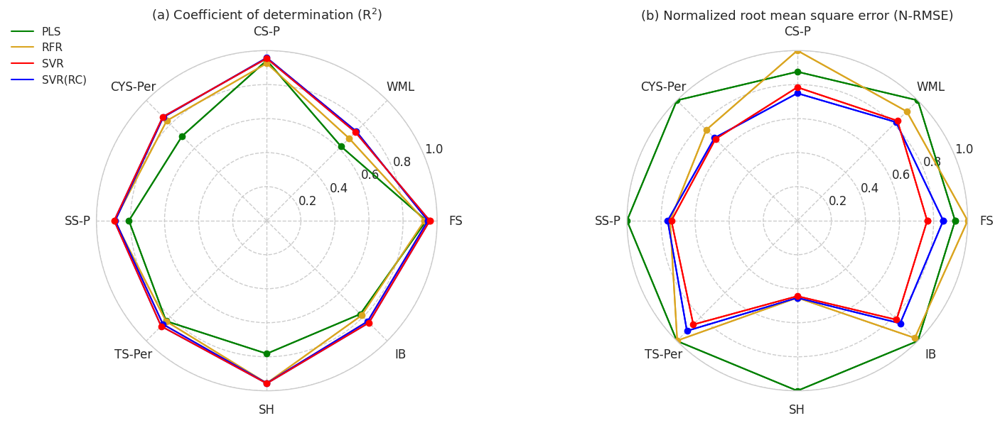

In [55]:
# data for the radar chart:
#categories = Y_test.columns
categories = ['FS', 'WML', 'CS-P', 'CYS-Per', 'SS-P', 'TS-Per', 'SH', 'IB']

angles =[0.0, 0.7853981633974483, 1.5707963267948966, 2.356194490192345, 3.141592653589793, 3.9269908169872414, 4.71238898038469, 5.497787143782138, 0]
radar_r2= pd.concat((accuracy_test.T, pd.DataFrame(accuracy_test.T['FS (MPa)'])),axis=1).T
radar_RMSE = pd.concat((RMSE_test.T, pd.DataFrame(RMSE_test.T['FS (MPa)'])),axis=1).T
radar_Normalized_RMSE = (radar_RMSE.T/radar_RMSE.T.max()).T
radar_mode = pd.concat((mode_test.T, pd.DataFrame(mode_test.T['FS (MPa)'])),axis=1).T

values_r2_pls = radar_r2['PLS']
values_r2_rfr = radar_r2['RFR']
values_r2_svr = radar_r2['SVR']
values_r2_svrc = radar_r2['SVRC']

values_rmse_pls = radar_Normalized_RMSE['PLS']
values_rmse_rfr = radar_Normalized_RMSE['RFR']
values_rmse_svr = radar_Normalized_RMSE['SVR']
values_rmse_svrc = radar_Normalized_RMSE['SVRC']

values_mode_obs = radar_mode['Observed']
values_mode_pls = radar_mode['PLS']
values_mode_rfr = radar_mode['RFR']
values_mode_svr = radar_mode['SVR']
values_mode_svrc = radar_mode['SVRC']

# plot:
fig, [ax1,ax2] = plt.subplots(1,2,subplot_kw={'polar': True}, figsize=(16,6), dpi=100)

ax1.plot(angles, values_r2_pls, 'green', label='PLS')  # Fill the area under the radar line
ax1.plot(angles, values_r2_rfr, 'goldenrod', label='RFR')  # Fill the area under the radar line
ax1.plot(angles, values_r2_svr, 'red', label='SVR')  # Fill the area under the radar line
ax1.plot(angles, values_r2_svrc, 'blue', alpha=1, label='SVR(RC)')  # Fill the area under the radar line
ax1.plot(angles, values_r2_pls, 'o-', color='green')  # Fill the area under the radar line
ax1.plot(angles, values_r2_rfr, 'o-', color='goldenrod')  # Fill the area under the radar line
ax1.plot(angles, values_r2_svr, 'o-', color='blue')  # Fill the area under the radar line
ax1.plot(angles, values_r2_svrc, 'o-', color='red')  # Fill the area under the radar line
ax1.set_xticklabels(categories, fontsize= Size_Title-3)
ax1.tick_params(axis='x', pad = 12)  # Change the value of 'pad' as needed
ax1.set_yticklabels(['0.2', '0.4', '0.6', '0.8', '1.0'], fontsize= Size_Title-3)  # Labels in degrees
ax1.set_ylim(0,1)


ax2.plot(angles, values_rmse_pls, 'green', label='PLS')  # Fill the area under the radar line
ax2.plot(angles, values_rmse_rfr, 'goldenrod', label='RFR')  # Fill the area under the radar line
ax2.plot(angles, values_rmse_svr, 'blue', label='SVR')  # Fill the area under the radar line
ax2.plot(angles, values_rmse_svrc, 'red', label='SVR(RC)')  # Fill the area under the radar line
ax2.plot(angles, values_rmse_pls, 'o-', color='green')  # Fill the area under the radar line
ax2.plot(angles, values_rmse_rfr, 'o-', color='goldenrod')  # Fill the area under the radar line
ax2.plot(angles, values_rmse_svr, 'o-', color='blue')  # Fill the area under the radar line
ax2.plot(angles, values_rmse_svrc, 'o-', color='red')  # Fill the area under the radar line
ax2.set_xticklabels(categories, fontsize= Size_Title-3)
ax2.set_yticklabels(['0.2', '0.4', '0.6', '0.8', '1.0'], fontsize= Size_Title-3)  # Labels in degrees
ax2.tick_params(axis='x', pad = 12)
ax2.set_ylim(0,1)



# add title:
ax1.set_title('(a) Coefficient of determination (R$^2$)', fontsize=13)
ax2.set_title('(b) Normalized root mean square error (N-RMSE)', fontsize=13)
ax1.legend(loc='upper right', bbox_to_anchor=(0, 1.1), fontsize = Size_Legend)
plt.tight_layout()  # Adjust spacing between subplots
plt.savefig('Summary_accuracy.png', format='png')
plt.show()

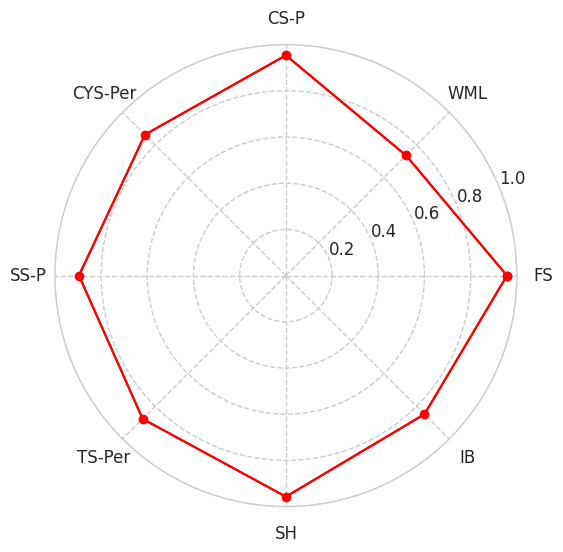

In [48]:
# data for the radar chart:
#categories = Y_test.columns
categories = ['FS', 'WML', 'CS-P', 'CYS-Per', 'SS-P', 'TS-Per', 'SH', 'IB']

angles =[0.0, 0.7853981633974483, 1.5707963267948966, 2.356194490192345, 3.141592653589793, 3.9269908169872414, 4.71238898038469, 5.497787143782138, 0]
radar_r2= pd.concat((accuracy_test.T, pd.DataFrame(accuracy_test.T['FS (MPa)'])),axis=1).T
radar_RMSE = pd.concat((RMSE_test.T, pd.DataFrame(RMSE_test.T['FS (MPa)'])),axis=1).T
radar_Normalized_RMSE = (radar_RMSE.T/radar_RMSE.T.max()).T
radar_mode = pd.concat((mode_test.T, pd.DataFrame(mode_test.T['FS (MPa)'])),axis=1).T

values_r2_pls = radar_r2['PLS']
values_r2_rfr = radar_r2['RFR']
values_r2_svr = radar_r2['SVR']
values_r2_svrc = radar_r2['SVRC']

values_rmse_pls = radar_Normalized_RMSE['PLS']
values_rmse_rfr = radar_Normalized_RMSE['RFR']
values_rmse_svr = radar_Normalized_RMSE['SVR']
values_rmse_svrc = radar_Normalized_RMSE['SVRC']

values_mode_obs = radar_mode['Observed']
values_mode_pls = radar_mode['PLS']
values_mode_rfr = radar_mode['RFR']
values_mode_svr = radar_mode['SVR']
values_mode_svrc = radar_mode['SVRC']

# plot:
fig, ax1 = plt.subplots(subplot_kw={'polar': True}, figsize=(8,6), dpi=100)

ax1.plot(angles, values_r2_svrc, 'red', alpha=1, label='SVRC')  # Fill the area under the radar line
ax1.plot(angles, values_r2_svrc, 'o-', color='red')  # Fill the area under the radar line
ax1.set_xticklabels(categories, fontsize= Size_Title-3)
ax1.tick_params(axis='x', pad = 12)  # Change the value of 'pad' as needed
ax1.set_yticklabels(['0.2', '0.4', '0.6', '0.8', '1.0'], fontsize= Size_Title-3)  # Labels in degrees
ax1.set_ylim(0,1)


plt.savefig('Graphical_Abstract.png', format='png')
plt.show()

In [49]:
values_mode_pls

FS (MPa)         88.4273
WML (MJ/m3)      76.1790
CS-P (MPa)       91.8230
CYS-Per (MPa)    61.9933
SS-P (MPa)       75.5684
TS-Per (MPa)     88.2447
SH (kN)          73.9355
IB (mm)          84.8892
FS (MPa)         88.4273
Name: PLS, dtype: float64

In [50]:
values_mode_rfr

FS (MPa)         102.8470
WML (MJ/m3)       91.5168
CS-P (MPa)        97.7294
CYS-Per (MPa)     89.5444
SS-P (MPa)        88.7994
TS-Per (MPa)      95.1216
SH (kN)           92.8955
IB (mm)          106.8168
FS (MPa)         102.8470
Name: RFR, dtype: float64

In [51]:
values_mode_svr

FS (MPa)         101.8973
WML (MJ/m3)       88.5944
CS-P (MPa)        99.4475
CYS-Per (MPa)     92.5607
SS-P (MPa)        94.5417
TS-Per (MPa)      93.1408
SH (kN)           91.6661
IB (mm)           99.2402
FS (MPa)         101.8973
Name: SVR, dtype: float64

In [52]:
values_mode_obs

FS (MPa)         100.0
WML (MJ/m3)      100.0
CS-P (MPa)       100.0
CYS-Per (MPa)    100.0
SS-P (MPa)       100.0
TS-Per (MPa)     100.0
SH (kN)          100.0
IB (mm)          100.0
FS (MPa)         100.0
Name: Observed, dtype: float64

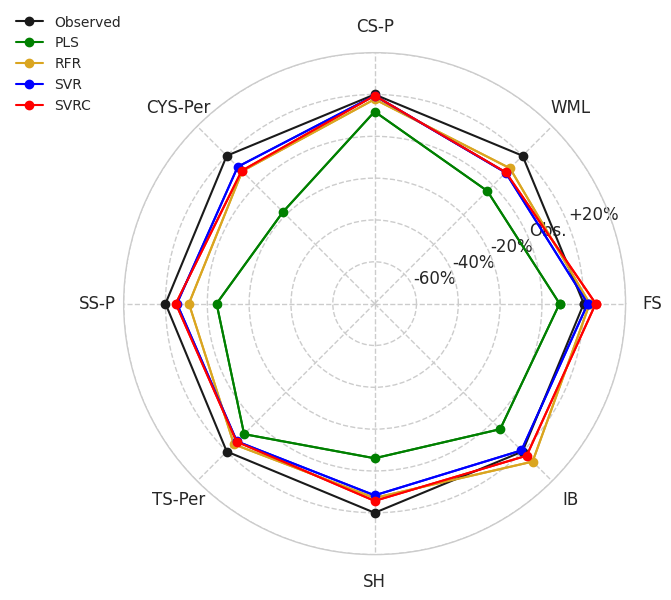

In [53]:
fig, ax = plt.subplots(1,1,subplot_kw={'polar': True}, figsize=(8,6), dpi=100)

#ax.plot(angles, values_mode_obs, 'ok', label= 'Observed')  # Fill the area under the radar line
ax.plot(angles, values_mode_pls, 'green' )  # Fill the area under the radar line
ax.plot(angles, values_mode_rfr, 'goldenrod')  # Fill the area under the radar line
ax.plot(angles, values_mode_svr, 'blue')  # Fill the area under the radar line
ax.plot(angles, values_mode_svrc, 'red')  # Fill the area under the radar line

ax.plot(angles, values_mode_obs, 'o-', color= 'k', label= 'Observed')  # Fill the area under the radar line
ax.plot(angles, values_mode_pls, 'o-', color='green', label='PLS')  # Fill the area under the radar line
ax.plot(angles, values_mode_rfr, 'o-', color='goldenrod', label='RFR')  # Fill the area under the radar line
ax.plot(angles, values_mode_svr, 'o-', color='blue', label='SVR')  # Fill the area under the radar line
ax.plot(angles, values_mode_svrc, 'o-', color='red', label= 'SVRC')  # Fill the area under the radar line

#def plot_center_circle(ax):
#    center_circle = plt.Circle((0.5, 0.5), 0.42, transform=ax.transAxes, edgecolor='black', facecolor='none', lw=2.0)
#    ax.add_patch(center_circle)
#plot_center_circle(ax)

#ax.set_xticks(angles)
ax.set_xticklabels(categories, fontsize= Size_Title-3)
ax.set_yticklabels([ '-60%', '-40%', '-20%', 'Obs.','+20%'], fontsize= Size_Title-3)  # Labels in degrees
ax.tick_params(axis='x', pad= 12)
ax.set_ylim(0,120)
ax.legend(loc='upper right', bbox_to_anchor=(0.02, 1.10), fontsize=10)
plt.tight_layout()
plt.savefig('Summary_mode.png', format='png')
plt.show()

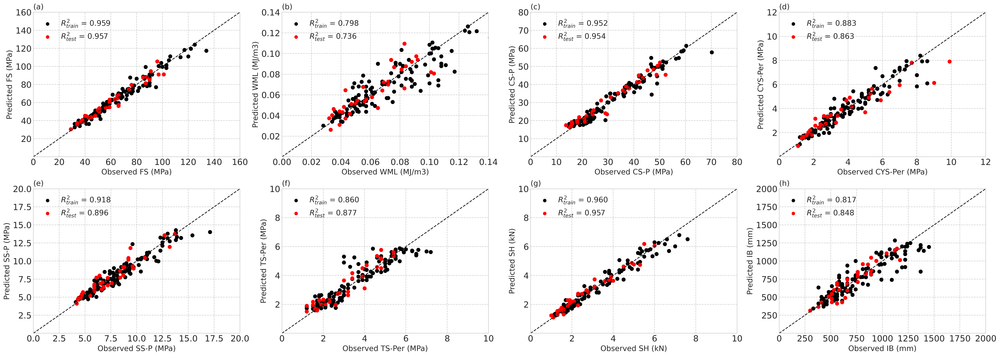

In [54]:
from scipy.optimize import curve_fit
from scipy.stats import t


def linear_plot(x, y, z, color, linestyle, label):
    model = LinearRegression(fit_intercept=True)
    model.fit(np.array(x)[:, np.newaxis], np.array(y))
    yintercept=(model.intercept_)
    slope=model.coef_[0]
    return plt.plot(z,(yintercept+z*slope), color=color, linestyle=linestyle, label = label)

def Linear_fun(x, a, b):
    return a * x + b


def confidence_bound(y_Exp, y_Pre):
    # Fit the linear function to the logarithmically transformed data
    params, covariance = curve_fit(Linear_fun, y_Exp, y_Pre)
    a_est, b_est = params
    se_a, se_b = np.sqrt(np.diag(covariance))

    # Calculate the lower bound of the 95% confidence interval for y_Pre
    confidence_level = 0.95
    alpha = 1 - confidence_level
    t_critical = t.ppf(1 - alpha / 2, len(y_Exp) - 2)
    y_Pre_lower = (y_Exp * a_est + b_est - t_critical * se_b)
    y_Pre_upper = (y_Exp * a_est + b_est + t_critical * se_b)
    y_Pre = (y_Exp * a_est + b_est)

    return [y_Pre_lower,y_Pre,y_Pre_upper]




def plot_pred_multi(title, column, y_test, y_test_pred, y_train, y_train_pred, step, axis_lim):
    plt.scatter(y_train, y_train_pred, color='black', s=50)
    plt.scatter(y_test, y_test_pred, color='red', s=50)

    #linear_plot(y_test, y_test_pred, np.arange(axis_lim*0.1, axis_lim*0.95, step),'k','-','')
    #linear_plot(y_test,confidence_bound(y_test, y_test_pred)[0], np.arange(axis_lim*0.1, axis_lim*0.95, step),'b','--', '')
    #linear_plot(y_test,confidence_bound(y_test, y_test_pred)[1], np.arange(axis_lim*0.1, axis_lim*0.95, step),'b','-','Best fit')
    #linear_plot(y_test,confidence_bound(y_test, y_test_pred)[2], np.arange(axis_lim*0.1, axis_lim*0.95, step),'b','--','95% confidence interval')


    #lower_bound=confidence_bound(y_test, y_test_pred)[0]
    #best_fit=confidence_bound(y_test, y_test_pred)[1]
    #upper_bound=confidence_bound(y_test, y_test_pred)[2]
    #rme=(100*(upper_bound-lower_bound)*0.5/best_fit).mean().round(3)

    plt.plot([0,axis_lim], [0,axis_lim], color='k', linestyle='--')

    plt.xlabel(f'Observed {column}', fontsize= Size_Title)
    plt.ylabel(f'Predicted {column}', fontsize= Size_Title)
    plt.tick_params(axis='both', direction='in')# , size= Size_Axis_Value)
    plt.title(title, fontsize= Size_Title, loc='left')
    plt.grid(linestyle='--')
    #plt.xlim(0,y_test.max()+(y_test.max()-y_test.min())/3)
    #plt.ylim(0,y_test.max()+(y_test.max()-y_test.min())/3)

    plt.xlim(0, axis_lim)
    plt.ylim(0.0001, axis_lim)

    R2_train='%.3f'%r2_score(y_train, y_train_pred)
    R2='%.3f'%r2_score(y_test, y_test_pred)

    #plt.scatter([100000],[1000000], label='    ', color='white')
    plt.scatter([100000],[1000000], label= f'$R^2_{{train}}$ = {R2_train}', color='black')
    plt.scatter([100000],[1000000], label= f'$R^2_{{test}}$ = {R2}', color='red')
    #plt.text(y_test.mean(), 0.8*y_test.min(), f'$R^2; Test dataset$ = {R2}', fontsize= Size_Title)

    plt.legend(loc=2, fontsize = Size_Title)
    plt.xticks(fontsize=Size_Axis_Value)
    plt.yticks(fontsize=Size_Axis_Value)




plt.figure (figsize = (28,10), dpi=400)
#plt.figure (figsize = (14,20), dpi=400)
x2=4
x1=2
plt.subplot(x1,x2,1)
plot_pred_multi(f'(a)', Y_test.columns[0], Y_test.iloc[:, 0], predict('SVRC')['FS (MPa)'], Y_train.iloc[:, 0], predict_train('SVRC')['FS (MPa)'],1, 160)

plt.subplot(x1,x2,2)
plot_pred_multi(f'(b)', Y_test.columns[1], Y_test.iloc[:, 1], predict('SVRC')['WML (MJ/m3)'], Y_train.iloc[:, 1], predict_train('SVRC')['WML (MJ/m3)'], 0.01, 0.14)

plt.subplot(x1,x2,3)
plot_pred_multi(f'(c)', Y_test.columns[2], Y_test.iloc[:, 2], predict('SVRC')['CS-P (MPa)'],Y_train.iloc[:, 2], predict_train('SVRC')['CS-P (MPa)'], 1,80)

plt.subplot(x1,x2,4)
plot_pred_multi(f'(d)', Y_test.columns[3], Y_test.iloc[:, 3], predict('SVRC')['CYS-Per (MPa)'],Y_train.iloc[:, 3], predict_train('SVRC')['CYS-Per (MPa)'], 1,12)

plt.subplot(x1,x2,5)
plot_pred_multi(f'(e)', Y_test.columns[4], Y_test.iloc[:, 4], predict('SVRC')['SS-P (MPa)'], Y_train.iloc[:, 4], predict_train('SVRC')['SS-P (MPa)'], 1,20)

plt.subplot(x1,x2,6)
plot_pred_multi(f'(f)', Y_test.columns[5], Y_test.iloc[:, 5], predict('SVRC')['TS-Per (MPa)'], Y_train.iloc[:, 5], predict_train('SVRC')['TS-Per (MPa)'],1,10)

plt.subplot(x1,x2,7)
plot_pred_multi(f'(g)', Y_test.columns[6], Y_test.iloc[:, 6], predict('SVRC')['SH (kN)'], Y_train.iloc[:, 6], predict_train('SVRC')['SH (kN)'], 1,10)

plt.subplot(x1,x2,8)
plot_pred_multi(f'(h)',  Y_test.columns[7], Y_test.iloc[:, 7], predict('SVRC')['IB (mm)'], Y_train.iloc[:, 7], predict_train('SVRC')['IB (mm)'], 1, 2000)

plt.tight_layout()
plt.savefig('r2-summary.png', format='png')

In [56]:
[elapsed_time_pls, elapsed_time_rfr, elapsed_time_svr, elapsed_time_svrrc]

[0.16328954696655273,
 499.08782291412354,
 276.15764713287354,
 19.432964324951172]

In [57]:
[elapsed_time_pls, elapsed_time_rfr/elapsed_time_pls, elapsed_time_svr/elapsed_time_pls, elapsed_time_svrrc/elapsed_time_pls]

[0.16328954696655273,
 3056.459107063073,
 1691.2144853304053,
 119.00923657367795]

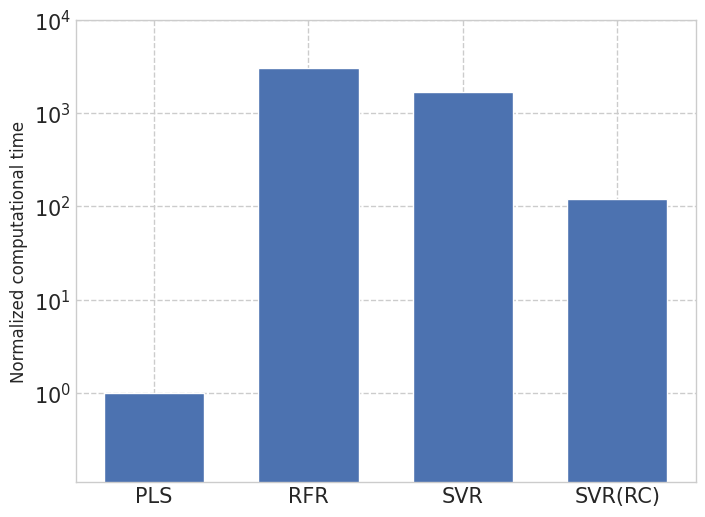

In [58]:
Normalized_computational_time = [elapsed_time_pls/elapsed_time_pls, elapsed_time_rfr/elapsed_time_pls, elapsed_time_svr/elapsed_time_pls, elapsed_time_svrrc/elapsed_time_pls]

fig, ax = plt.subplots(figsize=(8,6),dpi=100)
x=np.arange(len(['PLS','RFR', 'SVR', 'SVR(RC)']))
ax.bar(x, Normalized_computational_time,
       align='center', width=0.65, alpha=1, ecolor='black', capsize=5,label='Weight')
ax.set_xticks(x)
ax.set_xticklabels(['PLS','RFR', 'SVR', 'SVR(RC)'],fontsize = 10)
plt.tick_params(axis='both', direction='in')
plt.ylabel('Normalized computational time',fontsize = 12)
plt.yscale('log')
plt.ylim(0.11,10000)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0, fontsize = Size_Title)
ax.set_yticklabels(ax.get_yticklabels(),rotation=0, fontsize = Size_Title)
plt.grid(linestyle='--', axis='x')
plt.savefig('Computational_time.png',format='png')
plt.show()